In [3]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import os
import numpy as np
import warnings
from sklearn.experimental import enable_iterative_imputer 
from sklearn.impute import IterativeImputer

warnings.filterwarnings('ignore', category=FutureWarning)


# Data Reading

#### 先只写数据读取，把合并留到后面写

# 2.2数据描述必须描述数据的格式、数量、字段和表面特征。

In [4]:
# 分别为每个年份创建DataFrame
data_2013 = pd.read_csv("2013.csv")
data_2015 = pd.read_csv("2015.csv")
data_2016 = pd.read_csv("2016.csv")
data_2017 = pd.read_csv("2017.csv")
data_2018 = pd.read_csv("2018.csv")
data_2019 = pd.read_csv("2019.csv")
data_2020 = pd.read_csv("2020.csv")
data_2021 = pd.read_csv("2021.csv")
data_2022 = pd.read_csv("2022.csv")
data_2023 = pd.read_csv("2023.csv")




In [5]:



folder_path = '/Users/zhoudaozhen/Desktop/722/iteration3'

data_frames = []
common_columns = None

for year in range(2013, 2024):
    if year != 2014:
        file_path = os.path.join(folder_path, f"{year}.csv")
        if os.path.exists(file_path):
            df = pd.read_csv(file_path)
            data_frames.append(df)
            if common_columns is None:
                common_columns = set(df.columns)
            else:
                common_columns.intersection_update(df.columns)

filtered_data_frames = [df[list(common_columns)] for df in data_frames]

combined_data = pd.concat(filtered_data_frames, ignore_index=True)


data_attribute = pd.read_excel('P_Data_Extract_From_World_Development_Indicators.xlsx')



In [6]:
combined_data

,Freedom,Generosity,Health (Life Expectancy),Country,Trust (Government Corruption),Year,Economy (GDP per Capita),Happiness Rank,Happiness Score
0,0.937,0.222,71.228,Denmark,0.176,2013,32333.000,1,7.693
1,0.947,0.063,72.492,Norway,0.421,2013,48071.000,2,7.655
2,0.918,0.129,73.561,Switzerland,0.319,2013,39476.000,3,7.650
3,0.908,0.312,72.338,Netherlands,0.378,2013,36854.000,4,7.512
4,0.930,0.134,74.213,Sweden,0.226,2013,33869.000,5,7.480
...,...,...,...,...,...,...,...,...,...
1519,0.375,0.086,0.105,Congo (Kinshasa),0.068,2023,0.531,133,3.207
1520,0.363,-0.046,0.069,Zimbabwe,0.117,2023,0.758,134,3.204
1521,0.371,0.105,0.092,Sierra Leone,0.051,2023,0.670,135,3.138
1522,0.123,-0.141,0.398,Lebanon,0.027,2023,1.417,136,2.392


In [7]:
data_2013.head(15)

,Year,Country,Region,Happiness Score,Social Support,Freedom,Trust (Government Corruption),Donation,Generosity,Positive Affect,Negative Affect,Happiness (Yesterday),Economy (GDP per Capita),Health (Life Expectancy),Happiness Rank
0,2013,Denmark,0,7.693,0.963,0.937,0.176,0.629,0.222,0.776,0.179,0.647,32333.0,71.228,1
1,2013,Norway,0,7.655,0.942,0.947,0.421,0.498,0.063,0.823,0.213,0.749,48071.0,72.492,2
2,2013,Switzerland,0,7.650,0.943,0.918,0.319,0.550,0.129,0.859,0.176,0.907,39476.0,73.561,3
3,2013,Netherlands,0,7.512,0.945,0.908,0.378,0.728,0.312,0.859,0.205,0.844,36854.0,72.338,4
4,2013,Sweden,0,7.480,0.940,0.930,0.226,0.544,0.134,0.834,0.183,0.791,33869.0,74.213,5
5,2013,Canada,7,7.477,0.942,0.932,0.437,0.653,0.247,0.872,0.236,0.911,35294.0,72.082,6
6,2013,Finland,0,7.389,0.934,0.924,0.356,0.459,0.055,0.801,0.203,0.857,31257.0,72.409,7
7,2013,Austria,0,7.369,0.929,0.913,0.642,0.532,0.119,0.810,0.153,0.890,35211.0,72.148,8
8,2013,Iceland,0,7.355,0.978,0.898,0.747,0.651,0.240,0.900,0.157,0.907,34636.0,73.587,9
9,2013,Australia,7,7.350,0.955,0.937,0.362,0.715,0.303,0.820,0.210,0.863,34571.0,72.948,10


In [8]:
round(data_2013.describe().transpose(),2)

,count,mean,std,min,25%,50%,75%,max
Year,156.0,2013.00,0.00,2013.00,2013.00,2013.00,2013.00,2013.00
Region,156.0,5.08,3.40,0.00,2.00,6.00,8.25,9.00
Happiness Score,156.0,5.42,1.10,2.94,4.58,5.33,6.27,7.69
Social Support,156.0,0.80,0.12,0.30,0.75,0.83,0.90,0.98
Freedom,156.0,0.72,0.14,0.36,0.61,0.74,0.83,0.95
Trust (Government Corruption),156.0,0.75,0.20,0.08,0.70,0.81,0.87,0.97
Donation,156.0,0.29,0.19,0.03,0.14,0.25,0.40,0.86
Generosity,156.0,0.00,0.16,-0.33,-0.10,-0.02,0.06,0.68
Positive Affect,156.0,0.70,0.12,0.30,0.60,0.71,0.80,0.91
Negative Affect,156.0,0.25,0.10,0.11,0.18,0.24,0.29,0.89


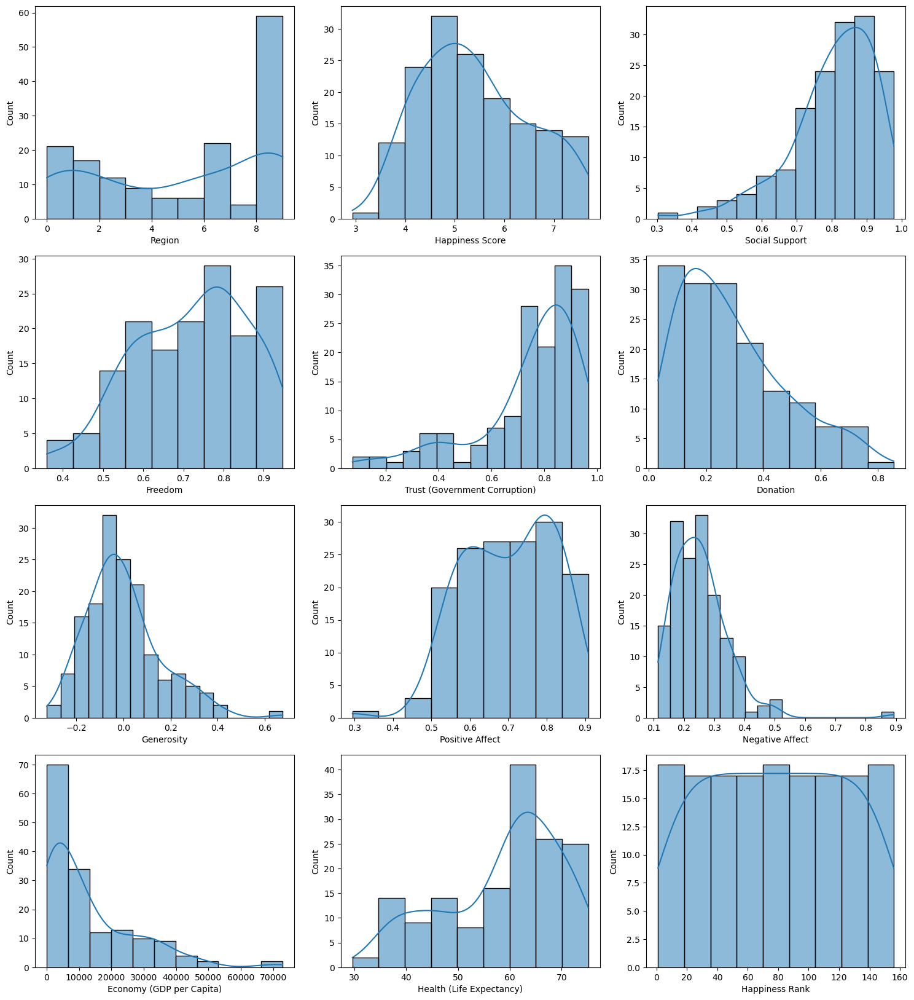

In [9]:
# 选择数值型数据列
numerical_cols = data_2013.select_dtypes(include=['number']).columns
numerical_cols = [col for col in numerical_cols if col not in ['Year', 'Happiness (Yesterday)']]
# 设置画布大小
plt.figure(figsize=(15, len(numerical_cols) // 3 * 5))

# 为每个数值型属性画图
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + 1, 3, i + 1)  # 确保有足够的行数容纳所有图
    sns.histplot(data_2013[col], kde=True)

# 调整子图间距
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/pic/9", format='png')
plt.show()


In [10]:
data_2020.head(10)

,Country,Region,Happiness Score,Standard error of ladder score,Whisker.high,Whisker.low,Logged GDP per capita,Social support,Healthy life expectancy,Freedom to make life choices,...,Ladder score in Dystopia,Economy (GDP per Capita),Explained by: Social support,Health (Life Expectancy),Freedom,Generosity.1,Trust (Government Corruption),Dystopia Residual,Year,Happiness Rank
0,Finland,Western Europe,7.8087,0.031156,7.869766,7.747634,10.639267,0.954330,71.900825,0.949172,...,1.972317,1.285190,1.499526,0.961271,0.662317,0.159670,0.477857,2.762835,2020,1
1,Denmark,Western Europe,7.6456,0.033492,7.711245,7.579955,10.774001,0.955991,72.402504,0.951444,...,1.972317,1.326949,1.503449,0.979333,0.665040,0.242793,0.495260,2.432741,2020,2
2,Switzerland,Western Europe,7.5599,0.035014,7.628528,7.491272,10.979933,0.942847,74.102448,0.921337,...,1.972317,1.390774,1.472403,1.040533,0.628954,0.269056,0.407946,2.350267,2020,3
3,Iceland,Western Europe,7.5045,0.059616,7.621347,7.387653,10.772559,0.974670,73.000000,0.948892,...,1.972317,1.326502,1.547567,1.000843,0.661981,0.362330,0.144541,2.460688,2020,4
4,Norway,Western Europe,7.4880,0.034837,7.556281,7.419719,11.087804,0.952487,73.200783,0.955750,...,1.972317,1.424207,1.495173,1.008072,0.670201,0.287985,0.434101,2.168266,2020,5
5,Netherlands,Western Europe,7.4489,0.027792,7.503372,7.394428,10.812712,0.939139,72.300919,0.908548,...,1.972317,1.338946,1.463646,0.975675,0.613626,0.336318,0.368570,2.352117,2020,6
6,Sweden,Western Europe,7.3535,0.036234,7.424519,7.282481,10.758794,0.926311,72.600769,0.939144,...,1.972317,1.322235,1.433348,0.986470,0.650298,0.272828,0.442066,2.246299,2020,7
7,New Zealand,North America and ANZ,7.2996,0.039465,7.376953,7.222248,10.500943,0.949119,73.202629,0.936217,...,1.972317,1.242318,1.487218,1.008138,0.646790,0.325726,0.461268,2.128108,2020,8
8,Austria,Western Europe,7.2942,0.033365,7.359596,7.228804,10.742824,0.928046,73.002502,0.899989,...,1.972317,1.317286,1.437445,1.000934,0.603369,0.255510,0.281256,2.398446,2020,9
9,Luxembourg,Western Europe,7.2375,0.030852,7.297970,7.177031,11.450681,0.906912,72.599998,0.905636,...,1.972317,1.536676,1.387528,0.986443,0.610137,0.195954,0.367041,2.153700,2020,10


In [11]:
round(data_2020.describe().transpose(),2)

,count,mean,std,min,25%,50%,75%,max
Happiness Score,153.0,5.47,1.11,2.57,4.72,5.51,6.23,7.81
Standard error of ladder score,153.0,0.05,0.02,0.03,0.04,0.05,0.06,0.12
Whisker.high,153.0,5.58,1.10,2.63,4.83,5.61,6.36,7.87
Whisker.low,153.0,5.37,1.13,2.51,4.60,5.43,6.14,7.75
Logged GDP per capita,153.0,9.30,1.20,6.49,8.35,9.46,10.27,11.45
Social support,153.0,0.81,0.12,0.32,0.74,0.83,0.91,0.97
Healthy life expectancy,153.0,64.45,7.06,45.20,58.96,66.31,69.29,76.80
Freedom to make life choices,153.0,0.78,0.12,0.40,0.71,0.80,0.88,0.97
Generosity,153.0,-0.01,0.15,-0.30,-0.13,-0.03,0.09,0.56
Perceptions of corruption,153.0,0.73,0.18,0.11,0.68,0.78,0.85,0.94


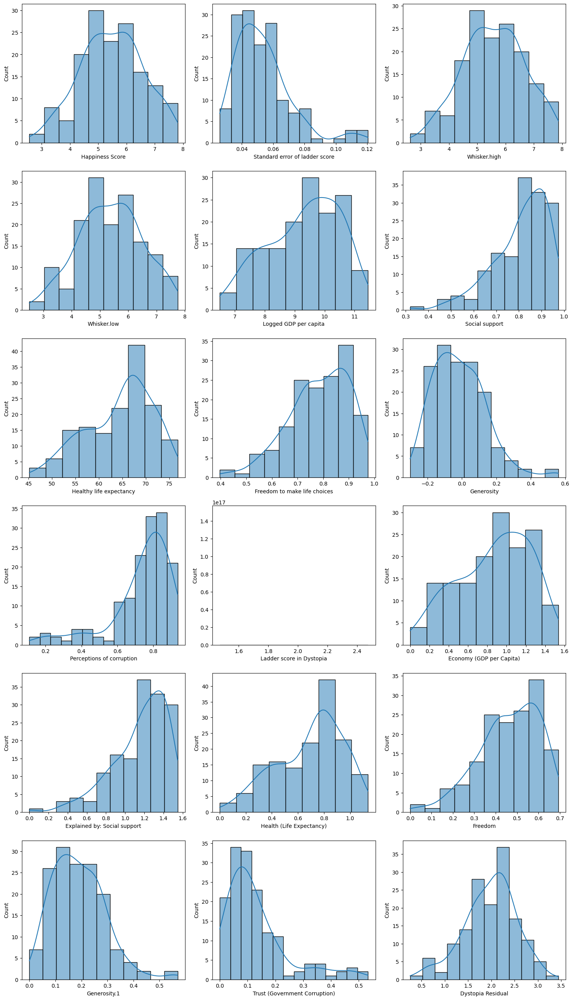

In [12]:
# 选择数值型数据列
numerical_cols = data_2020.select_dtypes(include=['number']).columns
numerical_cols = [col for col in numerical_cols if col not in ['Year', 'Happiness (Yesterday)','Happiness Rank']]
# 设置画布大小
plt.figure(figsize=(15, len(numerical_cols) // 3 * 5))

# 为每个数值型属性画图
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 3 + 1, 3, i + 1)  # 确保有足够的行数容纳所有图
    sns.histplot(data_2020[col], kde=True)

# 调整子图间距
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/pic/12", format='png')
plt.show()


In [24]:
print(f"number of rows: {combined_data.shape[0]}, number of colnums: {combined_data.shape[1]}")

number of rows: 1524, number of colnums: 9


In [25]:
combined_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1524 entries, 0 to 1523
Data columns (total 9 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Freedom                        1523 non-null   float64
 1   Generosity                     1523 non-null   float64
 2   Health (Life Expectancy)       1521 non-null   float64
 3   Country                        1524 non-null   object 
 4   Trust (Government Corruption)  1522 non-null   float64
 5   Year                           1524 non-null   int64  
 6   Economy (GDP per Capita)       1524 non-null   float64
 7   Happiness Rank                 1524 non-null   int64  
 8   Happiness Score                1524 non-null   float64
dtypes: float64(6), int64(2), object(1)
memory usage: 107.3+ KB


In [26]:
round(combined_data.describe().transpose(),2)

,count,mean,std,min,25%,50%,75%,max
Freedom,1523.0,0.51,0.20,0.00,0.38,0.51,0.63,0.97
Generosity,1523.0,0.13,0.17,-0.33,0.02,0.13,0.23,0.84
Health (Life Expectancy),1521.0,12.82,24.86,0.00,0.47,0.70,0.95,76.95
Trust (Government Corruption),1522.0,0.20,0.22,0.00,0.06,0.11,0.21,0.97
Year,1524.0,2018.30,3.02,2013.00,2016.00,2018.00,2021.00,2023.00
Economy (GDP per Capita),1524.0,1324.20,5955.93,0.00,0.76,1.12,1.45,72892.00
Happiness Rank,1524.0,76.82,44.21,1.00,39.00,77.00,115.00,158.00
Happiness Score,1524.0,5.44,1.12,0.00,4.59,5.42,6.26,7.84


In [27]:
print(f"number of rows: {data_attribute.shape[0]}, number of colnums: {data_attribute.shape[1]}")

number of rows: 2665, number of colnums: 125


In [28]:
data_attribute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2665 entries, 0 to 2664
Columns: 125 entries, Time to Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]
dtypes: float64(120), object(5)
memory usage: 2.5+ MB


接着转化数据格式再用一次描述

In [29]:
data_attribute.replace('..', np.nan, inplace=True)

In [30]:
data_attribute.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2665 entries, 0 to 2664
Columns: 125 entries, Time to Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]
dtypes: float64(120), object(5)
memory usage: 2.5+ MB


In [31]:
round(data_attribute.describe().transpose(),2)

,count,mean,std,min,25%,50%,75%,max
Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS],1896.0,6.576000e+01,3.682000e+01,0.00,2.870000e+01,8.340000e+01,1.000000e+02,1.000000e+02
Access to electricity (% of population) [EG.ELC.ACCS.ZS],2104.0,8.451000e+01,2.490000e+01,3.81,7.706000e+01,9.932000e+01,1.000000e+02,1.000000e+02
Account ownership at a financial institution or with a mobile-money-service provider (% of population ages 15+) [FX.OWN.TOTL.ZS],327.0,6.429000e+01,2.586000e+01,5.83,4.394000e+01,6.514000e+01,8.950000e+01,1.000000e+02
Adequacy of social insurance programs (% of total welfare of beneficiary households) [per_si_allsi.adq_pop_tot],197.0,4.234000e+01,4.081000e+01,0.24,2.756000e+01,3.477000e+01,4.489000e+01,3.221900e+02
Adequacy of social safety net programs (% of total welfare of beneficiary households) [per_sa_allsa.adq_pop_tot],203.0,1.270000e+01,1.329000e+01,1.03,5.180000e+00,9.410000e+00,1.478000e+01,1.047400e+02
...,...,...,...,...,...,...,...,...
Manufactures imports (% of merchandise imports) [TM.VAL.MANF.ZS.UN],1859.0,6.462000e+01,1.011000e+01,7.00,5.892000e+01,6.501000e+01,7.175000e+01,9.400000e+01
Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT],2260.0,6.412425e+11,2.141082e+12,0.00,1.697058e+09,1.382400e+10,2.185398e+11,2.504903e+13
Merchandise imports (current US$) [TM.VAL.MRCH.CD.WT],2263.0,6.409608e+11,2.159326e+12,21000000.00,3.244500e+09,1.786500e+10,2.185595e+11,2.575487e+13
Military expenditure (% of GDP) [MS.MIL.XPND.GD.ZS],1757.0,1.900000e+00,1.560000e+00,0.03,1.080000e+00,1.540000e+00,2.240000e+00,3.355000e+01


In [21]:
data_attribute

,Time,Time Code,Country,Country Code,Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS],Access to electricity (% of population) [EG.ELC.ACCS.ZS],Account ownership at a financial institution or with a mobile-money-service provider (% of population ages 15+) [FX.OWN.TOTL.ZS],Adequacy of social insurance programs (% of total welfare of beneficiary households) [per_si_allsi.adq_pop_tot],Adequacy of social safety net programs (% of total welfare of beneficiary households) [per_sa_allsa.adq_pop_tot],Adequacy of unemployment benefits and ALMP (% of total welfare of beneficiary households) [per_lm_alllm.adq_pop_tot],...,"Labor force, total [SL.TLF.TOTL.IN]","Literacy rate, adult female (% of females ages 15 and above) [SE.ADT.LITR.FE.ZS]","Life expectancy at birth, total (years) [SP.DYN.LE00.IN]",Manufactures exports (% of merchandise exports) [TX.VAL.MANF.ZS.UN],Manufactures imports (% of merchandise imports) [TM.VAL.MANF.ZS.UN],Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT],Merchandise imports (current US$) [TM.VAL.MRCH.CD.WT],Military expenditure (% of GDP) [MS.MIL.XPND.GD.ZS],Military expenditure (current LCU) [MS.MIL.XPND.CN],"Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]"
0,2013,YR2013,Afghanistan,AFG,24.3,68.040878,NaN,NaN,NaN,NaN,...,7881567.0,NaN,62.417,14.219335,6.999447,5.150000e+08,8.554000e+09,1.076950,12027666666.6667,43.1
1,2013,YR2013,Albania,ALB,72.3,99.890312,NaN,NaN,NaN,NaN,...,1227940.0,NaN,78.123,52.242901,61.496088,2.339000e+09,4.920000e+09,1.408982,19022000000,5.9
2,2013,YR2013,Algeria,DZA,99.4,99.187927,NaN,NaN,NaN,NaN,...,11793700.0,NaN,74.615,0.866851,70.130679,6.497400e+10,5.502800e+10,4.844509,806509000000,16.5
3,2013,YR2013,American Samoa,ASM,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,3.880000e+08,4.790000e+08,NaN,NaN,NaN
4,2013,YR2013,Andorra,AND,100.0,100.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,92.460470,62.578216,NaN,NaN,NaN,NaN,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2660,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2661,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2662,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2663,Data from database: World Development Indicators,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


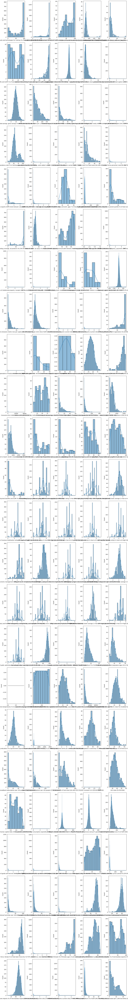

In [22]:
# 选择数值型数据列
numerical_cols = data_attribute.select_dtypes(include=['number']).columns
numerical_cols = [col for col in numerical_cols if col not in ['Year', 'Happiness (Yesterday)','Happiness Rank']]
# 设置画布大小
plt.figure(figsize=(15, len(numerical_cols) // 5 * 5))

# 为每个数值型属性画图
for i, col in enumerate(numerical_cols):
    plt.subplot(len(numerical_cols) // 5 + 1, 5, i + 1)  # 确保有足够的行数容纳所有图
    sns.histplot(data_attribute[col], kde=True)

# 调整子图间距
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/pic/17.png", format='png')
plt.show()


# 2.3-数据探索必须通过使用强大的可视化（可视化原始数据）来帮助读者理解数据。必须以明确的方式进行沟通，并与其他步骤明确相关联。

年份数据

NameError: name 'nx' is not defined

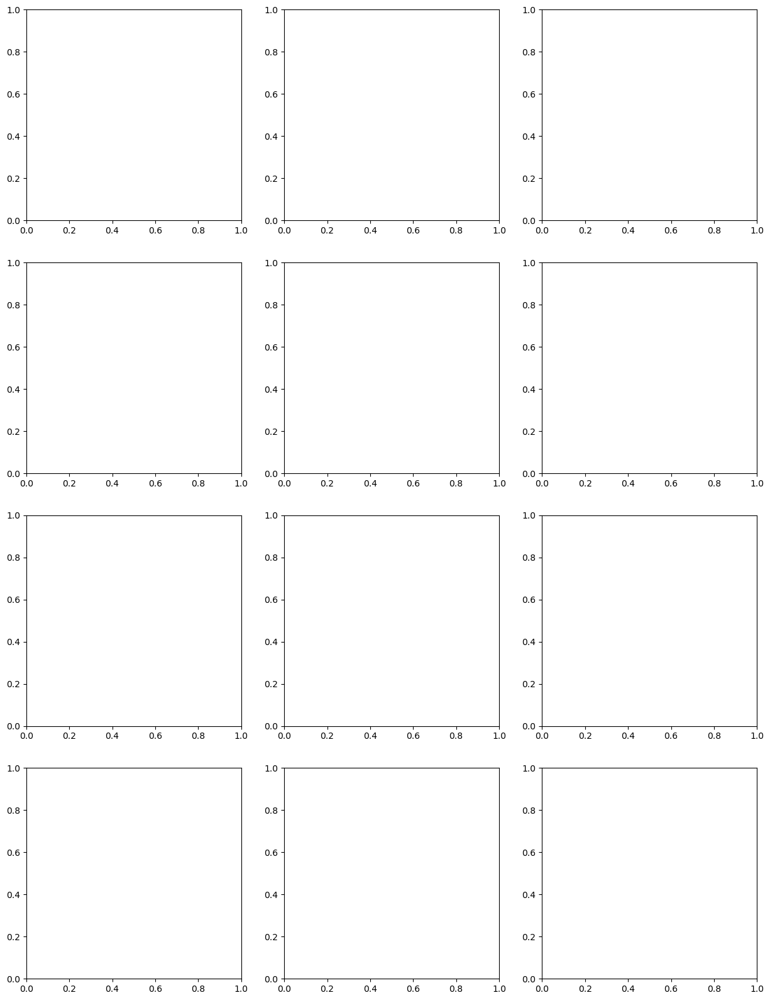

In [23]:
# 假设data_2015是你的DataFrame，并且它已经加载
regions = data_2015['Region'].unique()

# 每行显示三张图
num_cols = 3
num_rows = int(np.ceil(len(regions) / num_cols))

fig, axes = plt.subplots(num_rows, num_cols, figsize=(num_cols * 5, num_rows * 5))

for i, region in enumerate(regions):
    # 选择当前region的子DataFrame
    sub_df = data_2015[data_2015['Region'] == region]
    
    # 创建该region的图
    G = nx.Graph()
    G.add_node(region)  # 添加地区节点
    for country in sub_df['Country']:
        G.add_node(country)  # 添加国家节点
        G.add_edge(region, country)  # 创建边
    
    # 计算布局
    pos = nx.circular_layout(G)  # 为了简单起见，我们使用圆形布局
    
    # 计算当前子图的行列位置
    row = i // num_cols
    col = i % num_cols
    
    # 在子图上绘制网络图
    nx.draw(G, pos, ax=axes[row, col], with_labels=True)
    axes[row, col].set_title(region)
    
    # 如果当前行的图表数量不足，关闭剩余的子图
    if i == len(regions) - 1:
        for j in range(i + 1, num_rows * num_cols):
            fig.delaxes(axes.flatten()[j])

plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/1.png", format='png')
plt.show()

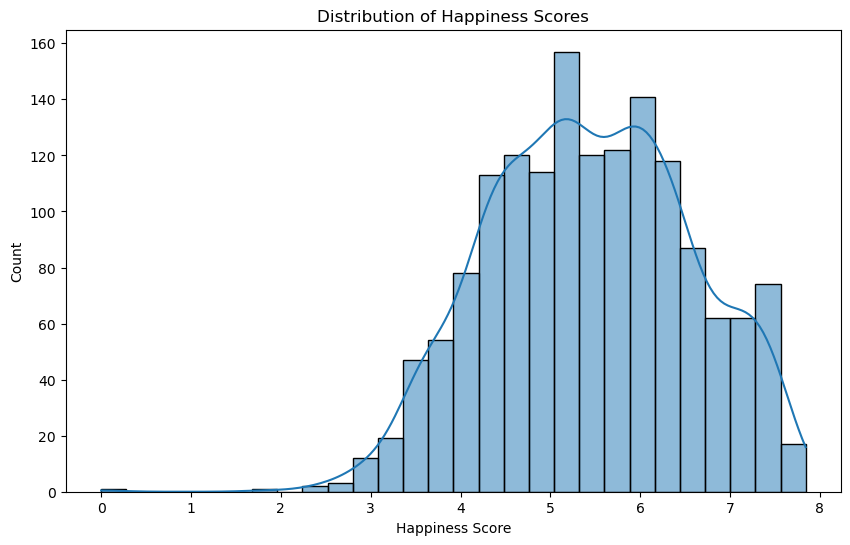

In [109]:
#3. 分布图（Distribution Plots）
# 绘制Happiness Score的分布
plt.figure(figsize=(10, 6))
sns.histplot(combined_data['Happiness Score'], kde=True)
plt.title('Distribution of Happiness Scores')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/2.png", format='png')
plt.show()


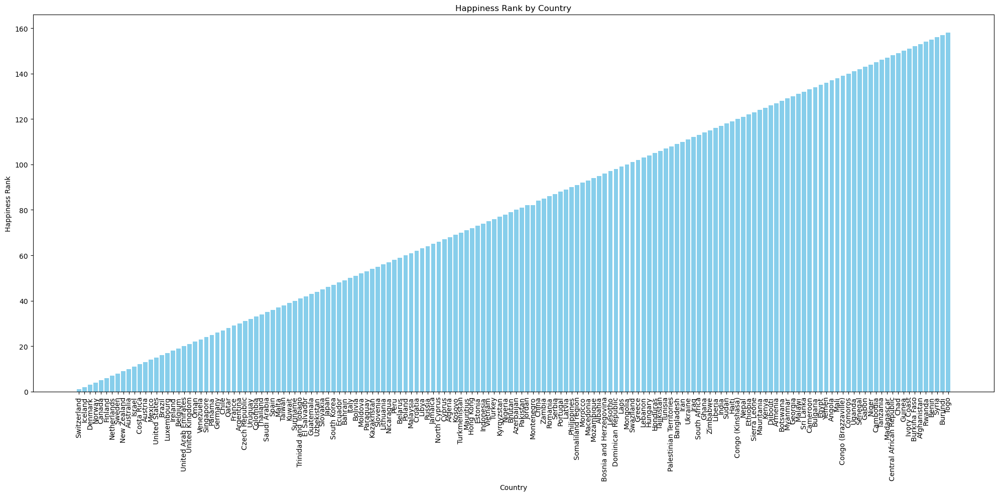

In [110]:
# 对数据按照Happiness Rank进行排序
df_sorted =data_2015.sort_values('Happiness Rank')

# 绘制直方图
plt.figure(figsize=(20, 10))  # 可以根据国家数量调整大小
plt.bar(df_sorted['Country'], df_sorted['Happiness Rank'], color='skyblue')

# 添加标题和轴标签
plt.title('Happiness Rank by Country')
plt.xlabel('Country')
plt.ylabel('Happiness Rank')

# 旋转x轴标签，以便国家名可以清晰地显示
plt.xticks(rotation=90)

# 在显示之前调整布局
plt.tight_layout()

plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/3.png", format='png')
plt.show()


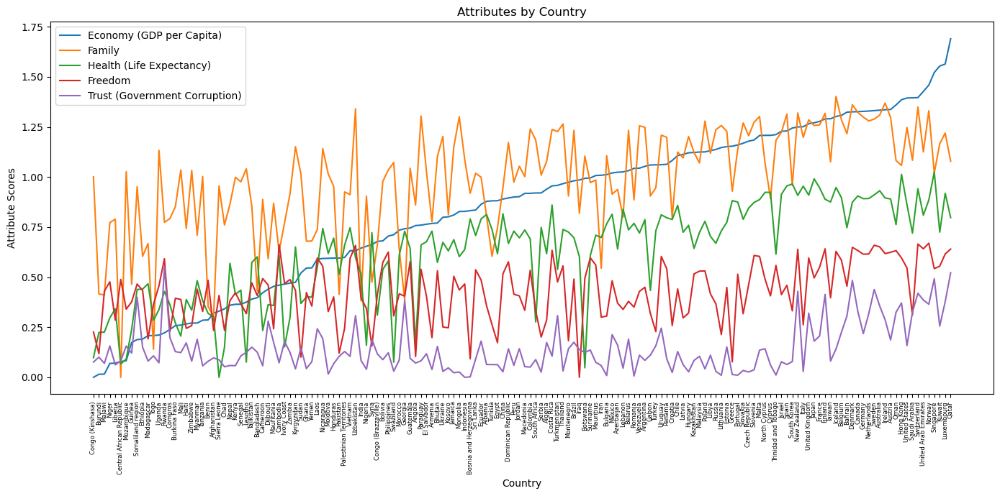

In [111]:
# 首先对数据进行排序，这里假设按照'Economy (GDP per Capita)'排序
data_2015_sorted = data_2015.sort_values('Economy (GDP per Capita)')

# 创建一个新的图形
plt.figure(figsize=(14, 7))

# 对于每个属性，绘制一个线图
for feature in ['Economy (GDP per Capita)', 'Family', 'Health (Life Expectancy)', 'Freedom', 'Trust (Government Corruption)']:
    plt.plot(data_2015_sorted['Country'], data_2015_sorted[feature], marker='', label=feature)

# 添加图例
plt.legend()

# 设置标题和轴标签
plt.title('Attributes by Country')
plt.xlabel('Country')
plt.ylabel('Attribute Scores')

# 旋转x轴的标签，以便国家名可以清晰地显示
plt.xticks(fontsize=6, rotation=90)

# 使用tight_layout确保所有的标签和标题都适合
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/4.png", format='png')
# 显示图表
plt.show()

<Figure size 1200x800 with 0 Axes>

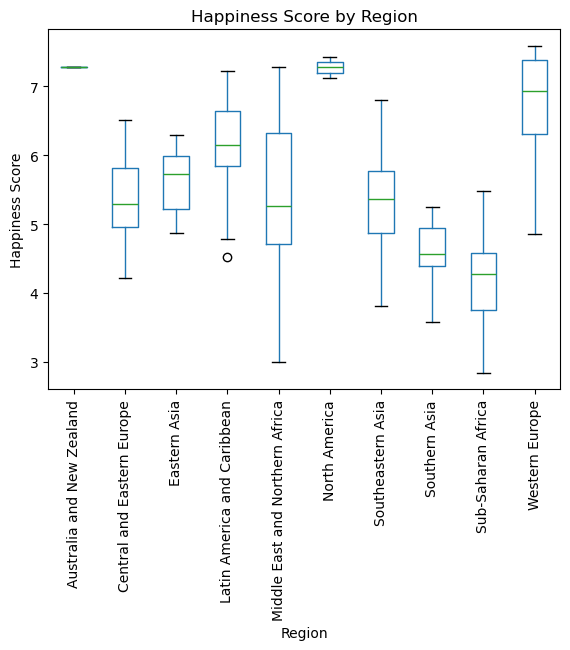

In [112]:
# 绘制箱型图
plt.figure(figsize=(12, 8))  # 设置图形大小
boxplot = data_2015.boxplot(column=['Happiness Score'], by='Region', grid=False)

# 设置标题和轴标签
plt.title('Happiness Score by Region')
plt.suptitle('')  # 移除默认的子标题
plt.xlabel('Region')
plt.ylabel('Happiness Score')

# 旋转x轴的标签，以便区域名可以清晰地显示
plt.xticks(rotation=90)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/5.png", format='png')
# 显示图表
plt.show()

<Figure size 1200x800 with 0 Axes>

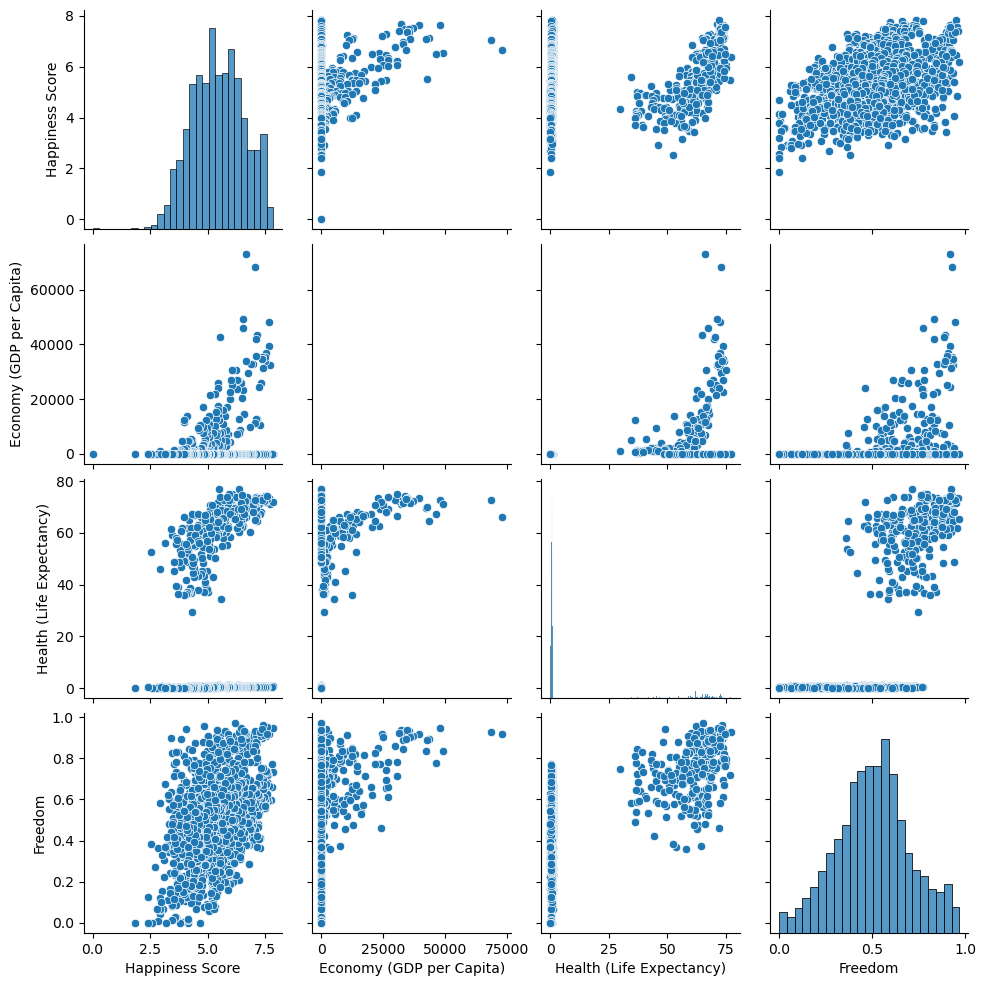

In [113]:
#5. 成对关系（Pair Plots）
# 选择数值类型的列来绘制成对关系
plt.figure(figsize=(12, 8))
sns.pairplot(combined_data[['Happiness Score', 'Economy (GDP per Capita)', 'Health (Life Expectancy)', 'Freedom']])
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/6.png", format='png')
plt.show()


属性数据

In [ ]:
dataatt = pd.read_excel('P_Data_Extract_From_World_Development_Indicators (3).xlsx')


In [ ]:
dataatt 

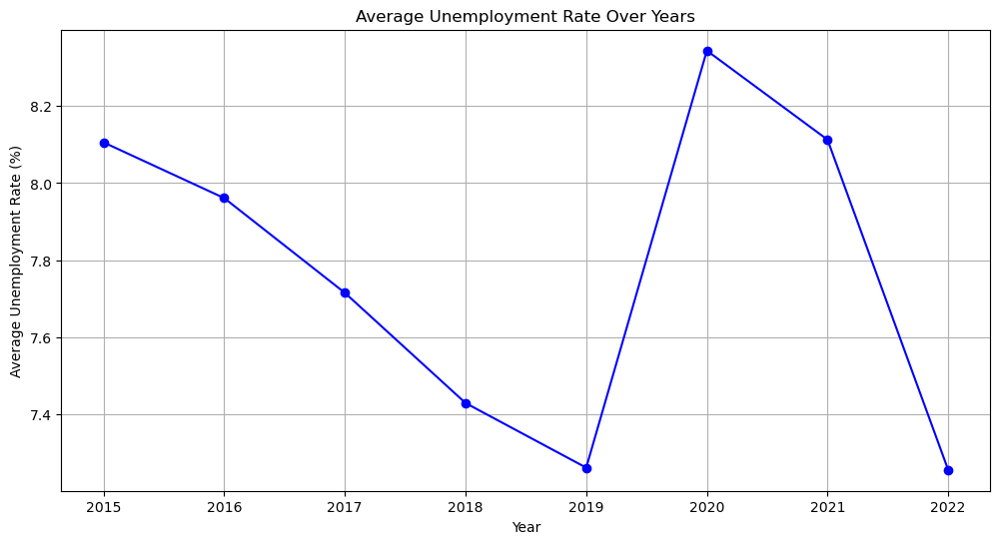

In [114]:

# 假设dataatt是你的DataFrame，并且已经加载
# 首先删除失业率列中的缺失值
data_clean = dataatt.dropna(subset=['Unemployment, total (% of total labor force) (modeled ILO estimate) [SL.UEM.TOTL.ZS]'])

# 计算每年的平均失业率
yearly_average = data_clean.groupby('Year')['Unemployment, total (% of total labor force) (modeled ILO estimate) [SL.UEM.TOTL.ZS]'].mean()

# 绘制折线图
plt.figure(figsize=(12, 6))  # 调整图形大小
plt.plot(yearly_average.index, yearly_average.values, marker='o', linestyle='-', color='b')

# 添加标题和轴标签
plt.title('Average Unemployment Rate Over Years')
plt.xlabel('Year')
plt.ylabel('Average Unemployment Rate (%)')

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/7.png", format='png')
# 显示图表
plt.show()

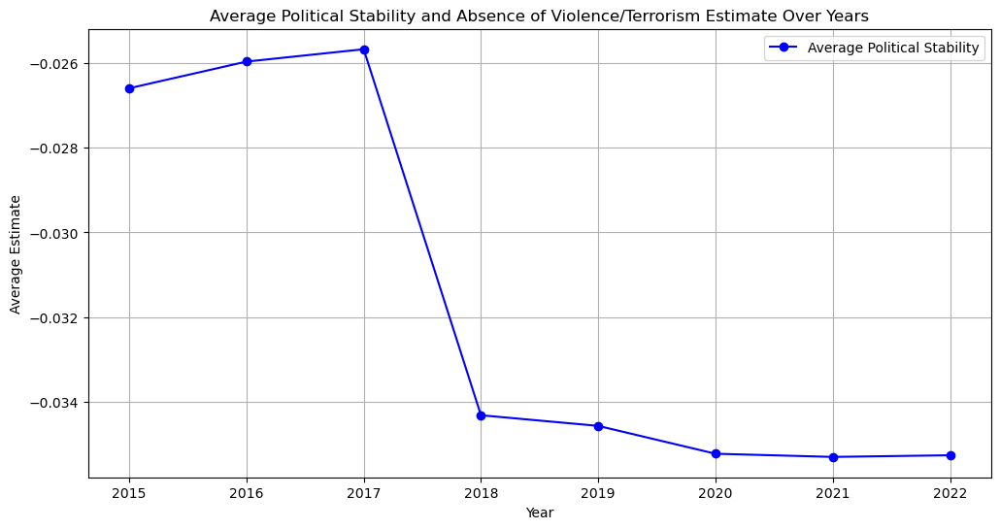

In [115]:
data_clean = dataatt.dropna(subset=['Political Stability and Absence of Violence/Terrorism: Estimate [PV.EST]'])

# 计算每年的平均政治稳定性评估
yearly_average = data_clean.groupby('Year')['Political Stability and Absence of Violence/Terrorism: Estimate [PV.EST]'].mean()

# 绘制折线图
plt.figure(figsize=(12, 6))  # 调整图形大小
plt.plot(yearly_average.index, yearly_average.values, marker='o', linestyle='-', color='b', label='Average Political Stability')

# 填充折线图上方的颜色
#plt.fill_between(yearly_average.index, yearly_average.values, color='blue', alpha=0.1)

# 添加标题和轴标签
plt.title('Average Political Stability and Absence of Violence/Terrorism Estimate Over Years')
plt.xlabel('Year')
plt.ylabel('Average Estimate')

# 显示图例
plt.legend()

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/8.png", format='png')
# 显示图表
plt.show()


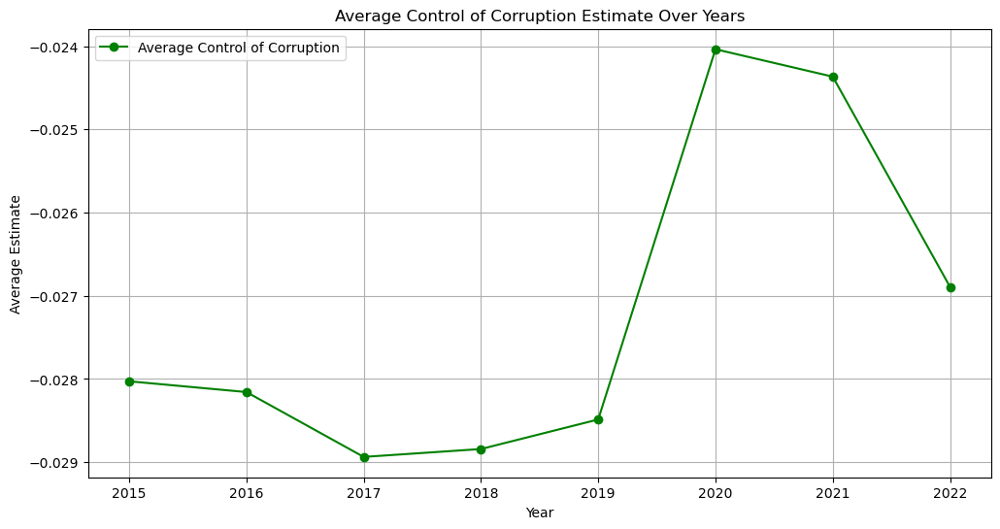

In [116]:
data_clean = dataatt.dropna(subset=['Control of Corruption: Estimate [CC.EST]'])

# 计算每年的平均“控制腐败评估”
yearly_average = data_clean.groupby('Year')['Control of Corruption: Estimate [CC.EST]'].mean()

# 绘制折线图
plt.figure(figsize=(12, 6))  # 调整图形大小
plt.plot(yearly_average.index, yearly_average.values, marker='o', linestyle='-', color='green', label='Average Control of Corruption')


# 添加标题和轴标签
plt.title('Average Control of Corruption Estimate Over Years')
plt.xlabel('Year')
plt.ylabel('Average Estimate')

# 显示图例
plt.legend()

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/9.png", format='png')
# 显示图表
plt.show()

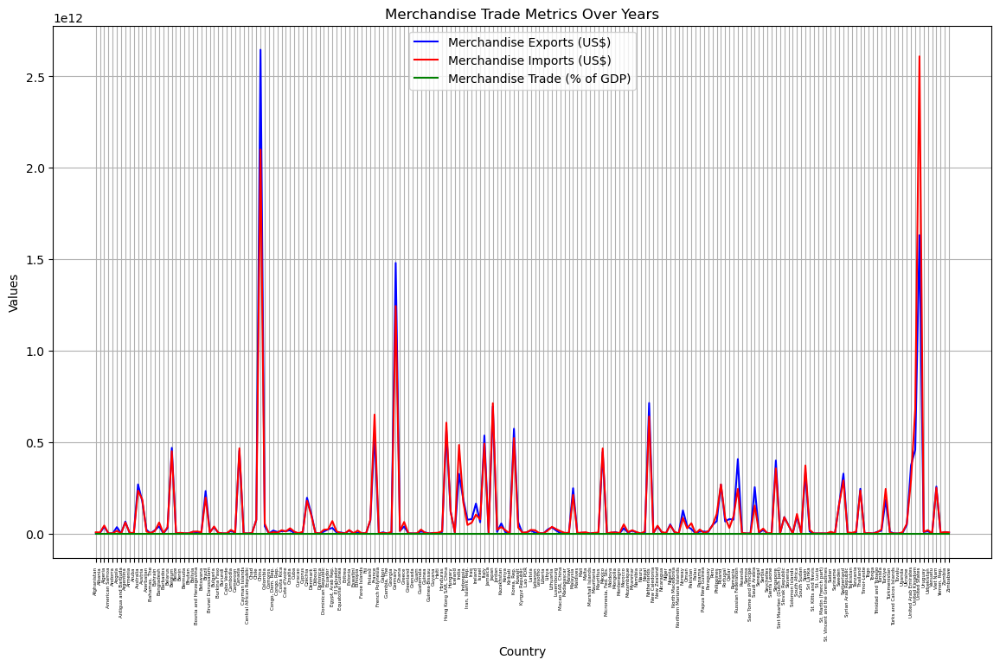

In [117]:
data_clean = dataatt.dropna(subset=[
    'Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT]',
    'Merchandise imports (current US$) [TM.VAL.MRCH.CD.WT]',
    'Merchandise trade (% of GDP) [TG.VAL.TOTL.GD.ZS]'
])

# 计算每年的平均值
yearly_average_exports = data_clean.groupby('Country')['Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT]'].mean()
yearly_average_imports = data_clean.groupby('Country')['Merchandise imports (current US$) [TM.VAL.MRCH.CD.WT]'].mean()
yearly_average_trade = data_clean.groupby('Country')['Merchandise trade (% of GDP) [TG.VAL.TOTL.GD.ZS]'].mean()

# 绘制折线图
plt.figure(figsize=(14, 8))  # 调整图形大小
plt.plot(yearly_average_exports.index, yearly_average_exports.values,  linestyle='-', color='blue', label='Merchandise Exports (US$)')
plt.plot(yearly_average_imports.index, yearly_average_imports.values,  linestyle='-', color='red', label='Merchandise Imports (US$)')
plt.plot(yearly_average_trade.index, yearly_average_trade.values,  linestyle='-', color='green', label='Merchandise Trade (% of GDP)')

# 添加标题和轴标签
plt.title('Merchandise Trade Metrics Over Years')
plt.xlabel('Country')
plt.ylabel('Values')
plt.xticks(fontsize=4, rotation=90)
# 显示图例
plt.legend()

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/10.png", format='png')
# 显示图表
plt.show()

In [96]:
combined_data

,Economy (GDP per Capita),Health (Life Expectancy),Freedom,Trust (Government Corruption),Country,Generosity,Happiness Rank,Year,Happiness Score
0,32333.000000,71.228000,0.937000,0.176000,Denmark,0.222000,1,2013,7.6930
1,48071.000000,72.492000,0.947000,0.421000,Norway,0.063000,2,2013,7.6550
2,39476.000000,73.561000,0.918000,0.319000,Switzerland,0.129000,3,2013,7.6500
3,36854.000000,72.338000,0.908000,0.378000,Netherlands,0.312000,4,2013,7.5120
4,33869.000000,74.213000,0.930000,0.226000,Sweden,0.134000,5,2013,7.4800
5,35294.000000,72.082000,0.932000,0.437000,Canada,0.247000,6,2013,7.4770
6,31257.000000,72.409000,0.924000,0.356000,Finland,0.055000,7,2013,7.3890
7,35211.000000,72.148000,0.913000,0.642000,Austria,0.119000,8,2013,7.3690
8,34636.000000,73.587000,0.898000,0.747000,Iceland,0.240000,9,2013,7.3550
9,34571.000000,72.948000,0.937000,0.362000,Australia,0.303000,10,2013,7.3500


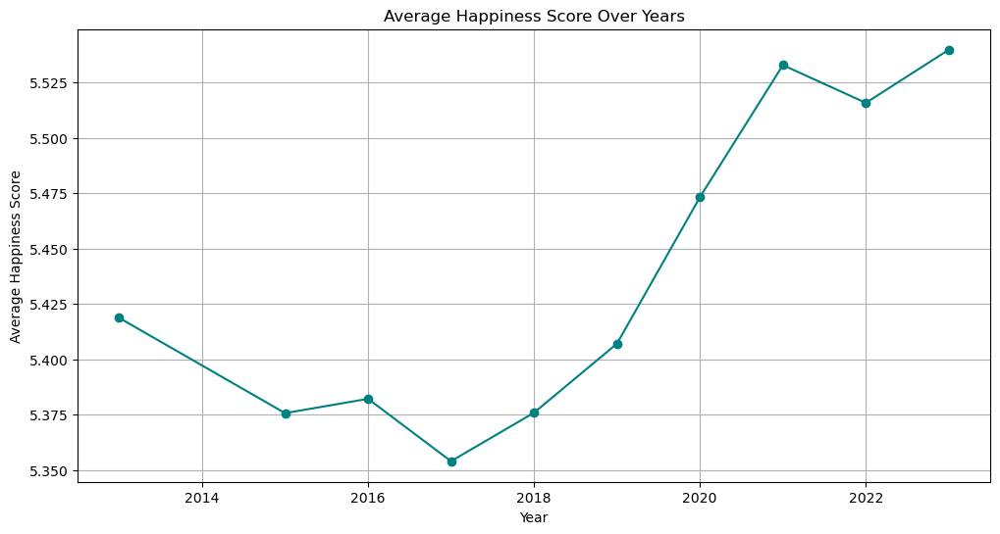

In [118]:
data_clean = combined_data.dropna(subset=['Happiness Score'])

# 计算每年的平均Happiness Score
yearly_average_happiness = data_clean.groupby('Year')['Happiness Score'].mean()

# 绘制折线图
plt.figure(figsize=(12, 6))  # 调整图形大小
plt.plot(yearly_average_happiness.index, yearly_average_happiness.values, marker='o', linestyle='-', color='teal')

# 添加标题和轴标签
plt.title('Average Happiness Score Over Years')
plt.xlabel('Year')
plt.ylabel('Average Happiness Score')

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/11.png", format='png')
# 显示图表
plt.show()

In [98]:
data_2015

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204,2015
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531,2015
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176,2015
5,Finland,Western Europe,6,7.406,0.03140,1.29025,1.31826,0.88911,0.64169,0.41372,0.23351,2.61955,2015
6,Netherlands,Western Europe,7,7.378,0.02799,1.32944,1.28017,0.89284,0.61576,0.31814,0.47610,2.46570,2015
7,Sweden,Western Europe,8,7.364,0.03157,1.33171,1.28907,0.91087,0.65980,0.43844,0.36262,2.37119,2015
8,New Zealand,Australia and New Zealand,9,7.286,0.03371,1.25018,1.31967,0.90837,0.63938,0.42922,0.47501,2.26425,2015
9,Australia,Australia and New Zealand,10,7.284,0.04083,1.33358,1.30923,0.93156,0.65124,0.35637,0.43562,2.26646,2015


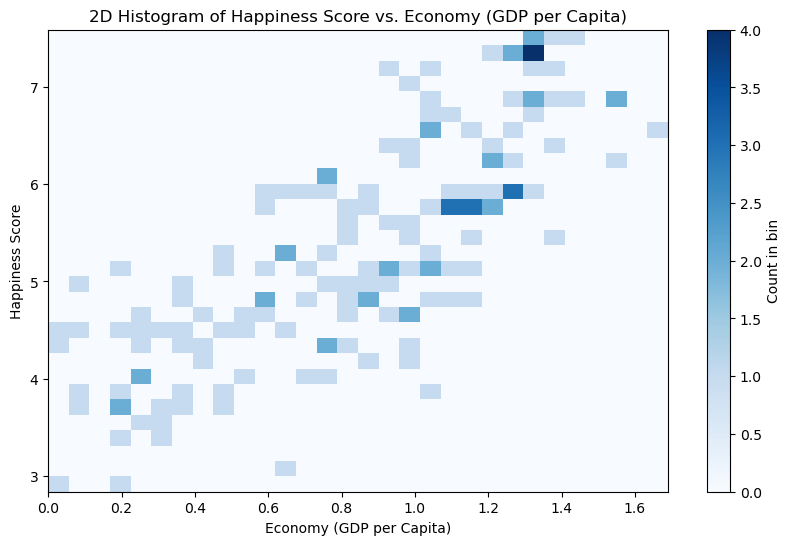

In [119]:
# 清洁数据
data_2015_clean = data_2015.dropna(subset=['Economy (GDP per Capita)', 'Happiness Score'])

# 绘制二维直方图
plt.figure(figsize=(10, 6))
plt.hist2d(data_2015_clean['Economy (GDP per Capita)'], data_2015_clean['Happiness Score'], bins=30, cmap='Blues')

# 添加颜色条
plt.colorbar(label='Count in bin')

# 添加标题和轴标签
plt.title('2D Histogram of Happiness Score vs. Economy (GDP per Capita)')
plt.xlabel('Economy (GDP per Capita)')
plt.ylabel('Happiness Score')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/12.png", format='png')
# 显示图表
plt.show()

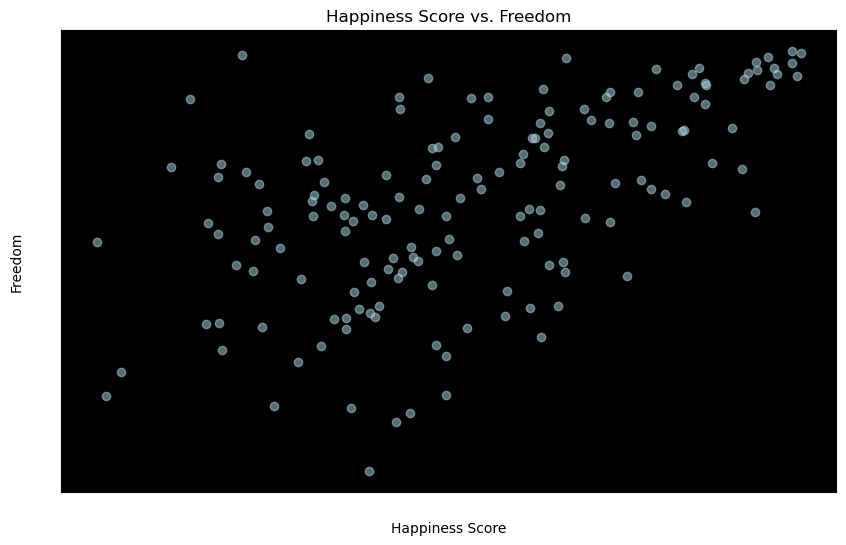

In [120]:
data_2015_clean = data_2015.dropna(subset=['Freedom', 'Happiness Score'])

# 创建散点图
plt.figure(figsize=(10, 6))
plt.scatter(data_2015_clean['Happiness Score'], data_2015_clean['Freedom'], alpha=0.5, color='lightblue')

# 设置背景颜色为黑色
plt.gca().set_facecolor('black')

# 添加标题和轴标签
plt.title('Happiness Score vs. Freedom')
plt.xlabel('Happiness Score')
plt.ylabel('Freedom')

# 设置轴标签和标题的颜色为白色
plt.tick_params(colors='white')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/13.png", format='png')
# 显示图表
plt.show()

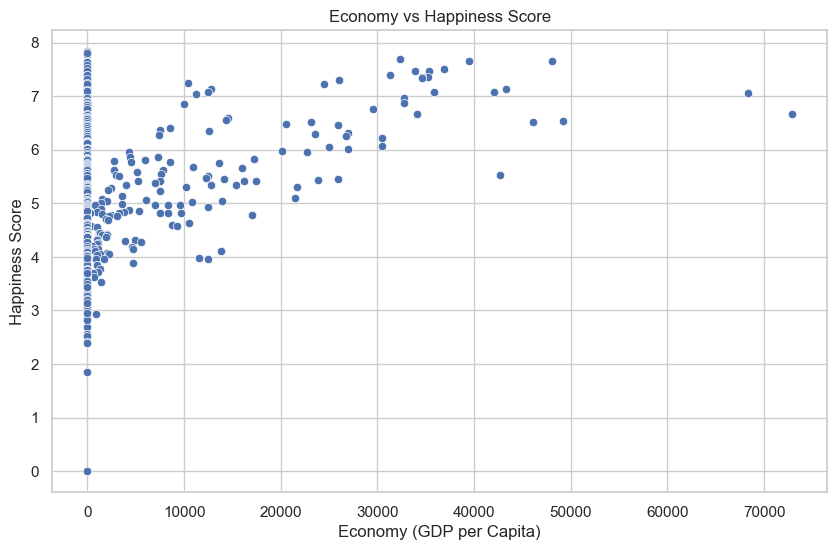

In [20]:
#1. 散点图（Scatter Plots）
# 设置绘图风格
sns.set(style="whitegrid")

# 绘制Economy和Happiness Score的关系
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Economy (GDP per Capita)', y='Happiness Score', data=combined_data)
plt.title('Economy vs Happiness Score')
plt.show()

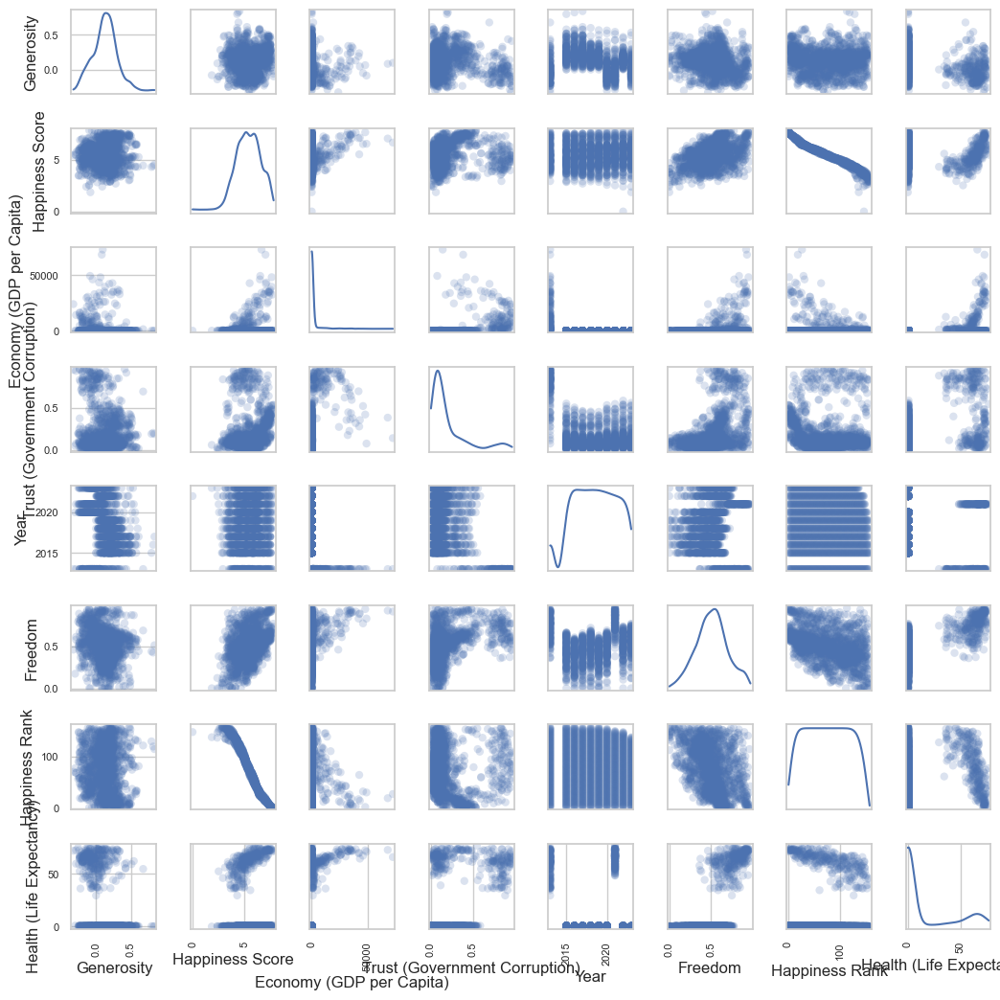

In [12]:
axes = pd.plotting.scatter_matrix(combined_data, alpha=0.2, figsize=(12, 12), diagonal='kde', marker='o', grid=True)

# 调整子图之间的间隔
plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1, wspace=0.4, hspace=0.4)

plt.show()

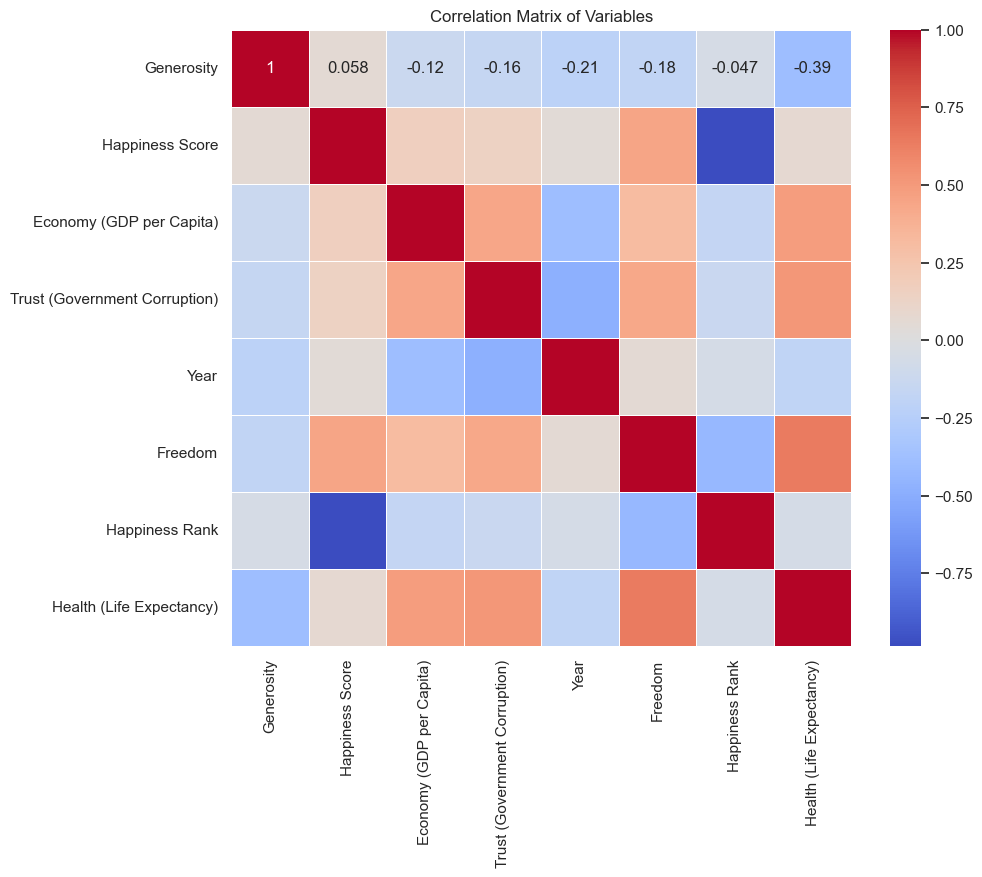

In [13]:
#2. 相关矩阵（Correlation Matrix）
plt.figure(figsize=(10, 8))
data1=combined_data.drop(columns=['Country'])
correlation_matrix = data1.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix of Variables')
plt.show()


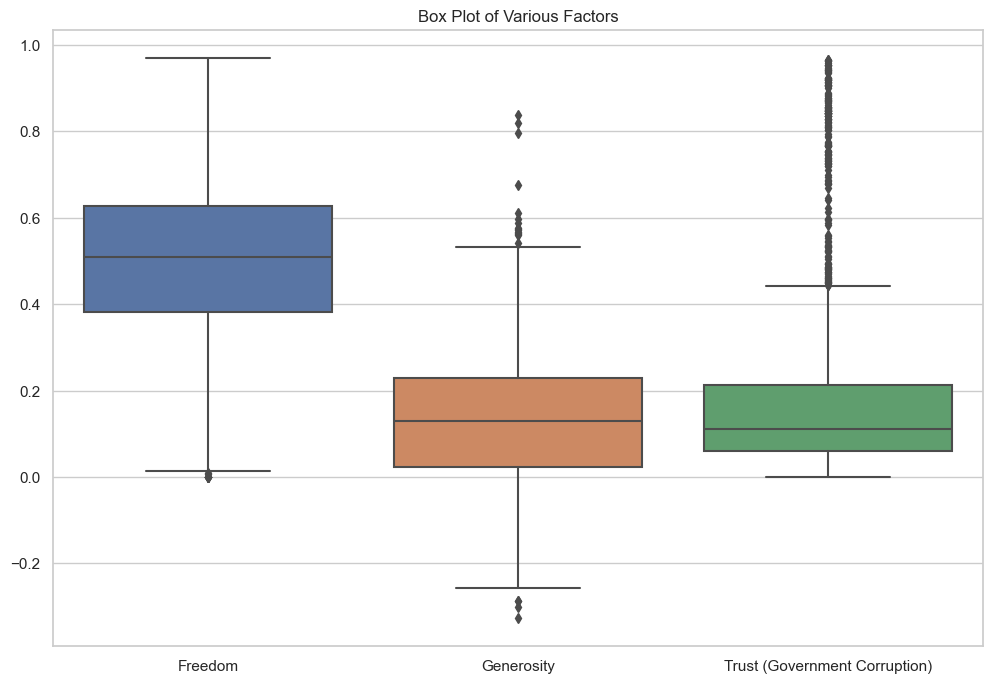

In [15]:
#4. 箱形图（Box Plots）
# 绘制各变量的箱形图，比较不同因素
plt.figure(figsize=(12, 8))
sns.boxplot(data=combined_data[['Freedom', 'Generosity', 'Trust (Government Corruption)']])
plt.title('Box Plot of Various Factors')
plt.show()


# 2.4-必须通过明确检查错误、缺失值和数据质量模式来验证数据质量。

In [ ]:
#先讲属性数据由于缺失数据表示成。。而全是字符串格式

缺失值显示

In [32]:
data_attribute.columns = [col.split(' (')[0] for col in data_attribute.columns]

# 计算每列的缺失值数量
missing_values = data_attribute.isnull().sum()

# 循环遍历每列的缺失值数量并打印
for column, missing_count in missing_values.items():
    print(f"{column}: {missing_count} ")



Time: 3 
Time Code: 5 
Country: 5 
Country Code: 5 
Access to clean fuels and technologies for cooking: 769 
Access to electricity: 561 
Account ownership at a financial institution or with a mobile-money-service provider: 2338 
Adequacy of social insurance programs: 2468 
Adequacy of social safety net programs: 2462 
Adequacy of unemployment benefits and ALMP: 2614 
Adjusted net enrollment rate, primary: 1855 
Adjusted net national income: 1261 
Adjusted savings: carbon dioxide damage: 728 
Adjusted savings: consumption of fixed capital: 1052 
Adjusted savings: gross savings: 1029 
Adolescent fertility rate: 545 
Adolescents out of school: 1605 
Adults: 1599 
Agricultural land: 601 
Age dependency ratio: 280 
Agriculture, forestry, and fishing, value added: 488 
Air transport, passengers carried [IS.AIR.PSGR]: 1041 
Arable land: 625 
Armed forces personnel, total [MS.MIL.TOTL.P1]: 1158 
Arms exports: 2106 
Arms imports: 1213 
Average working hours of children, study and work, ages 7-1

In [33]:
# 计算每列的缺失值数量
missing_values = combined_data.isnull().sum()

# 循环遍历每列的缺失值数量并打印
for column, missing_count in missing_values.items():
    print(f"{column}: {missing_count} ")


Freedom: 1 
Generosity: 1 
Health (Life Expectancy): 3 
Country: 0 
Trust (Government Corruption): 2 
Year: 0 
Economy (GDP per Capita): 0 
Happiness Rank: 0 
Happiness Score: 0 


In [34]:
print(data_attribute.dtypes)

Time                                                   object
Time Code                                              object
Country                                                object
Country Code                                           object
Access to clean fuels and technologies for cooking    float64
                                                       ...   
Merchandise exports                                   float64
Merchandise imports                                   float64
Military expenditure                                  float64
Military expenditure                                   object
Mortality rate, neonatal                              float64
Length: 125, dtype: object


重复记录

In [35]:
duplicates = data_attribute[data_attribute.duplicated()]
print("Number of duplicate entries:", duplicates.shape[0])

Number of duplicate entries: 2


In [36]:
duplicates = combined_data[combined_data.duplicated()]
print("Number of duplicate entries:", duplicates.shape[0])

Number of duplicate entries: 0


# 3.1-必须有效地选择数据。应明确考虑目标、数据质量、技术限制等因素。

### 1，删除缺失率太大的值

In [37]:
# 计算每列的缺失值比例
missing_ratio = data_attribute.isnull().mean() * 100

# 对缺失率进行排序，从高到低
missing_ratio_sorted = missing_ratio.sort_values(ascending=False)

# 打印每列的缺失率，按从高到低排序
for column, missing_count in missing_ratio_sorted.items():
    print(f"{column}: {missing_count} ")

Droughts, floods, extreme temperatures: 100.0 
Condom use, population ages 15-24, male: 99.73733583489681 
Condom use, population ages 15-24, female: 99.66228893058161 
Children in employment, wage workers: 99.28705440900562 
Children in employment, total: 99.13696060037523 
Average working hours of children, study and work, ages 7-14: 99.13696060037523 
Adequacy of unemployment benefits and ALMP: 98.08630393996248 
Coverage of unemployment benefits and ALMP: 95.94746716697937 
Consumption of iodized salt: 95.64727954971858 
Ease of doing business rank: 92.90806754221389 
Electric power consumption: 92.83302063789868 
Benefit incidence of social insurance programs to poorest quintile: 92.6078799249531 
Adequacy of social insurance programs: 92.6078799249531 
Adequacy of social safety net programs: 92.38273921200751 
Firms with female participation in ownership: 92.3076923076923 
Firms with female top manager: 92.3076923076923 
Coverage of social insurance programs: 92.19512195121952 
C

In [38]:
# 计算每列的缺失值比例
missing_ratio2 = combined_data.isnull().mean() * 100

# 对缺失率进行排序，从高到低
missing_ratio_sorted2 = missing_ratio2.sort_values(ascending=False)

# 打印每列的缺失率，按从高到低排序
for column, missing_count in missing_ratio_sorted2.items():
    print(f"{column}: {missing_count} ")

Health (Life Expectancy): 0.19685039370078738 
Trust (Government Corruption): 0.13123359580052493 
Freedom: 0.06561679790026247 
Generosity: 0.06561679790026247 
Country: 0.0 
Year: 0.0 
Economy (GDP per Capita): 0.0 
Happiness Rank: 0.0 
Happiness Score: 0.0 


In [39]:
# 定义阈值
threshold = 30

# 找出缺失率高于40%的列
columns_to_drop = missing_ratio[missing_ratio > threshold].index

# 删除这些列
data_attribute.drop(columns=columns_to_drop, inplace=True)




In [40]:
# 计算每列的缺失值比例
missing_ratio = data_attribute.isnull().mean() * 100

# 对缺失率进行排序，从高到低
missing_ratio_sorted = missing_ratio.sort_values(ascending=False)

# 打印每列的缺失率，按从高到低排序
for column, missing_count in missing_ratio_sorted.items():
    print(f"{column}: {missing_count} ")

GDP: 29.9437148217636 
Access to clean fuels and technologies for cooking: 28.855534709193247 
Insurance and financial services: 27.654784240150093 
Adjusted savings: carbon dioxide damage: 27.31707317073171 
Claims on central government, etc.: 26.97936210131332 
Mortality rate, neonatal: 26.75422138836773 
Individuals using the Internet: 25.70356472795497 
Inflation, consumer prices: 23.714821763602252 
Computer, communications and other services: 23.564727954971858 
Arable land: 23.452157598499063 
Commercial service exports: 23.452157598499063 
Imports of goods, services and primary income: 23.039399624765476 
Commercial service imports: 22.851782363977485 
Life expectancy at birth, total: 22.70168855534709 
Agricultural land: 22.551594746716695 
Fertility rate, total: 22.4765478424015 
Forest area: 21.350844277673545 
Access to electricity: 21.05065666041276 
Contributing family workers, total: 20.675422138836772 
Adolescent fertility rate: 20.45028142589118 
Fixed broadband subscr

### 2.选择非重复的值

In [41]:
duplicates = data_attribute[data_attribute.duplicated()]
print("Number of duplicate entries:", duplicates.shape[0])

Number of duplicate entries: 2


In [42]:
data_attribute = data_attribute.drop_duplicates()
duplicates = data_attribute[data_attribute.duplicated()]
print("Number of duplicate entries:", duplicates.shape[0])

Number of duplicate entries: 0


In [43]:
data_2015

,Country,Region,Happiness Rank,Happiness Score,Standard Error,Economy (GDP per Capita),Family,Health (Life Expectancy),Freedom,Trust (Government Corruption),Generosity,Dystopia Residual,Year
0,Switzerland,Western Europe,1,7.587,0.03411,1.39651,1.34951,0.94143,0.66557,0.41978,0.29678,2.51738,2015
1,Iceland,Western Europe,2,7.561,0.04884,1.30232,1.40223,0.94784,0.62877,0.14145,0.43630,2.70201,2015
2,Denmark,Western Europe,3,7.527,0.03328,1.32548,1.36058,0.87464,0.64938,0.48357,0.34139,2.49204,2015
3,Norway,Western Europe,4,7.522,0.03880,1.45900,1.33095,0.88521,0.66973,0.36503,0.34699,2.46531,2015
4,Canada,North America,5,7.427,0.03553,1.32629,1.32261,0.90563,0.63297,0.32957,0.45811,2.45176,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...
153,Rwanda,Sub-Saharan Africa,154,3.465,0.03464,0.22208,0.77370,0.42864,0.59201,0.55191,0.22628,0.67042,2015
154,Benin,Sub-Saharan Africa,155,3.340,0.03656,0.28665,0.35386,0.31910,0.48450,0.08010,0.18260,1.63328,2015
155,Syria,Middle East and Northern Africa,156,3.006,0.05015,0.66320,0.47489,0.72193,0.15684,0.18906,0.47179,0.32858,2015
156,Burundi,Sub-Saharan Africa,157,2.905,0.08658,0.01530,0.41587,0.22396,0.11850,0.10062,0.19727,1.83302,2015


<Figure size 1200x700 with 0 Axes>

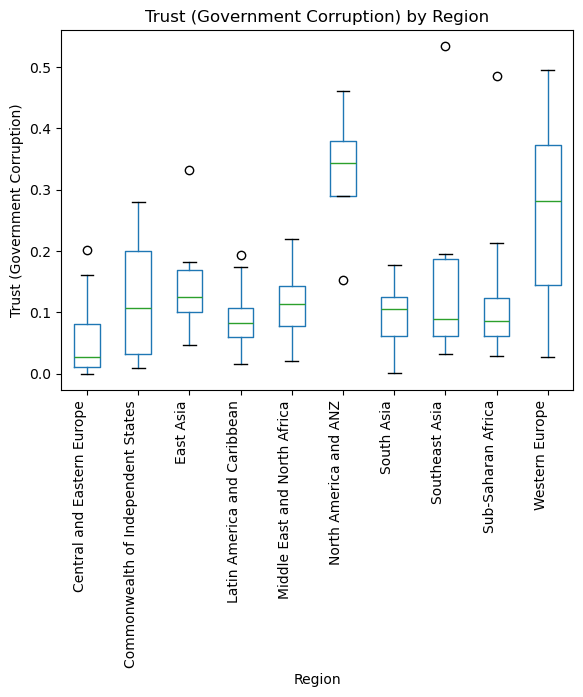

In [19]:
data_2015_clean = data_2020.dropna(subset=['Trust (Government Corruption)'])

# 绘制箱型图
plt.figure(figsize=(12, 7))
data_2015_clean.boxplot(column='Trust (Government Corruption)', by='Region', grid=False)

# 添加图表标题和轴标签
plt.title('Trust (Government Corruption) by Region')
plt.suptitle('')  # 去除默认的副标题
plt.xlabel('Region')
plt.ylabel('Trust (Government Corruption)')

# 优化x轴标签的显示
plt.xticks(rotation=90, ha='right')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/21.png", format='png')
# 显示图表
plt.show()

In [44]:
# 清除包含缺失值的行
data_clean = dataatt.dropna(subset=['Unemployment with advanced education (% of total labor force with advanced education) [SL.UEM.ADVN.ZS]'])

# 绘制二维直方图
plt.figure(figsize=(10, 5))
plt.hist(data_clean['Unemployment with advanced education (% of total labor force with advanced education) [SL.UEM.ADVN.ZS]'], bins=50, color='navy')

# 添加标题和轴标签
plt.title('Unemployment rate after higher education')
plt.xlabel('Unemployment with advanced education (% of total labor force with advanced education) [SL.UEM.ADVN.ZS]')
plt.ylabel('Frequency')

# 设置图形背景颜色为白色
plt.gca().set_facecolor('white')

# 显示网格
plt.grid(True)
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/22.png", format='png')
# 显示图表
plt.show()

NameError: name 'dataatt' is not defined

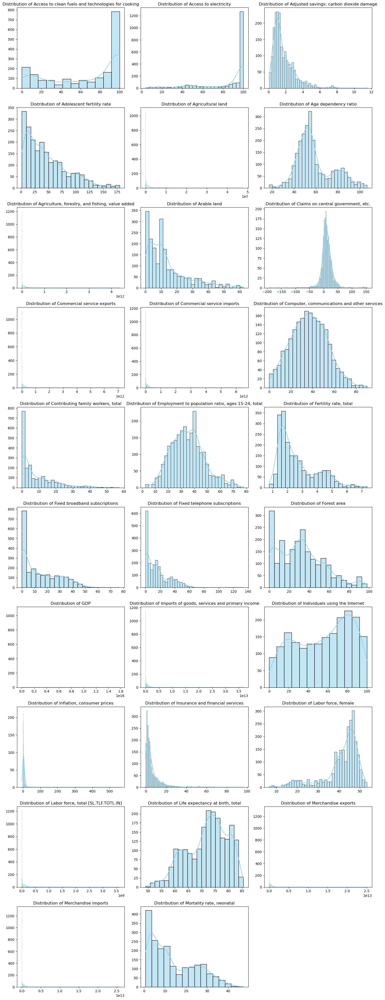

In [182]:
# 选择数据类型为数值的列
numeric_cols = data_attribute.select_dtypes(include=['int64', 'float64'])
# 设定每行显示的图形数
n_cols = 3
n_rows = (len(numeric_cols.columns) + n_cols - 1) // n_cols  # 确保有足够的行来展示所有图形

# 创建一个足够大的画布来容纳所有的直方图
plt.figure(figsize=(n_cols * 5, n_rows * 4))  # 宽度为5*n_cols, 高度为4*n_rows

for i, column in enumerate(numeric_cols.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(data_attribute[column], kde=True, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.show()

# 3.2 - 要清理数据，必须明确问题，然后明确解决。

In [45]:
#combined_data = pd.concat([data_2013, data_2015, data_2016, data_2017, data_2018, 
                           data_2019, data_2020, data_2021, data_2022, data_2023], 
                          axis=0, ignore_index=True)

print("Shape of the 2013 year dataset:", data_2013.shape)
print("Shape of the combined dataset:", combined_data.shape)

IndentationError: unexpected indent (2470823818.py, line 2)

In [46]:
data_attribute.replace('..', np.nan, inplace=True)

combined_data['Country'] = combined_data['Country'].str.replace('*', '', regex=False)

#问题二： 将列名'Time'改为'Year'，两个数据集不同意
data_attribute.rename(columns={'Time': 'Year'}, inplace=True)
 

/var/folders/v9/8m1g4hpx7nzgxrn_lwlp6c2c0000gn/T/ipykernel_17345/4070962396.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attribute.replace('..', np.nan, inplace=True)
/var/folders/v9/8m1g4hpx7nzgxrn_lwlp6c2c0000gn/T/ipykernel_17345/4070962396.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attribute.rename(columns={'Time': 'Year'}, inplace=True)


### 问题三：填充缺失值

In [47]:
numeric_df = data_attribute.select_dtypes(include=['int64', 'float64'])
imputer = IterativeImputer(max_iter=10, random_state=0)
numeric_df_filled = pd.DataFrame(imputer.fit_transform(numeric_df), columns=numeric_df.columns)

data_attribute.update(numeric_df_filled)

data_attribute



/Users/zhoudaozhen/anaconda3/lib/python3.11/site-packages/sklearn/impute/_iterative.py:785: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


,Year,Time Code,Country,Country Code,Access to clean fuels and technologies for cooking,Access to electricity,Adjusted savings: carbon dioxide damage,Adolescent fertility rate,Agricultural land,Age dependency ratio,...,"Imports of goods, services and primary income",Individuals using the Internet,"Inflation, consumer prices",Insurance and financial services,"Labor force, female","Labor force, total [SL.TLF.TOTL.IN]","Life expectancy at birth, total",Merchandise exports,Merchandise imports,"Mortality rate, neonatal"
0,2013,YR2013,Afghanistan,AFG,24.300000,68.040878,0.938296,106.537000,3.791000e+05,97.125534,...,1.018433e+10,5.900000,7.385772,5.826387,18.230563,7.881567e+06,62.417000,5.150000e+08,8.554000e+09,43.100000
1,2013,YR2013,Albania,ALB,72.300000,99.890312,1.104330,20.865000,1.187300e+04,46.586441,...,6.159382e+09,51.800000,1.937621,0.552222,41.853022,1.227940e+06,78.123000,2.339000e+09,4.920000e+09,5.900000
2,2013,YR2013,Algeria,DZA,99.400000,99.187927,2.185734,12.684000,4.143163e+05,49.534709,...,7.373838e+10,22.500000,3.254239,7.912973,18.713779,1.179370e+07,74.615000,6.497400e+10,5.502800e+10,16.500000
3,2013,YR2013,American Samoa,ASM,130.747075,99.288378,0.717202,43.498000,2.660000e+01,59.144144,...,1.780849e+11,98.731794,2.403206,6.615398,55.647592,2.646254e+06,81.442580,3.880000e+08,4.790000e+08,-0.954964
4,2013,YR2013,Andorra,AND,100.000000,100.000000,1.093647,6.989000,1.881000e+02,38.652083,...,9.293426e+11,84.400000,2.790863,14.078184,47.422997,-8.276349e+06,83.158277,5.419635e+11,5.972678e+11,2.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2658,2023,YR2023,Upper middle income,UMC,35.631847,50.478399,0.887671,105.280280,1.617787e+07,117.833555,...,8.609862e+11,23.357288,8.216272,7.243436,43.647700,1.440519e+09,64.990691,1.303170e+12,8.577667e+11,29.131740
2659,2023,YR2023,World,WLD,9.633714,32.402614,1.467271,141.679379,4.011658e+07,153.938996,...,7.369762e+11,-12.390852,7.502671,4.893768,40.080679,3.624639e+09,59.208132,2.433254e+12,1.235516e+12,45.338275
2660,NaN,NaN,NaN,NaN,69.933050,84.730185,1.724066,46.861607,1.948146e+06,58.880978,...,9.345510e+11,56.132956,5.760691,6.602522,41.270809,1.422261e+08,72.170920,6.321501e+11,6.333794e+11,12.879027
2663,Data from database: World Development Indicators,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
#from sklearn.experimental import enable_iterative_imputer
#from sklearn.impute import KNNImputer, IterativeImputer

#numeric_df = data_attribute.select_dtypes(include=['int64', 'float64'])

# 创建KNN填充器实例
#knn_imputer = KNNImputer(n_neighbors=5)

# 应用填充器
#numeric_df_filled_knn = pd.DataFrame(knn_imputer.fit_transform(numeric_df), columns=numeric_df.columns)

# 检查填充后的结果
#print(numeric_df_filled_knn)

# 合并填充后的数值数据与原始非数值数据
#data_attribute.update(numeric_df_filled_knn)

# 查看完整的DataFrame结果
#print(data_attribute)

### 统一国家名称

In [49]:
country_name_mapping = {
    'Congo (Brazzaville)': 'Congo, Rep.',
    'Czech Republic': 'Czechia',
    'Egypt': 'Egypt, Arab Rep.',
    'Gambia': 'Gambia, The',
    'Hong Kong S.A.R. of China': 'Hong Kong SAR, China',
    'Iran': 'Iran, Islamic Rep.',
    'Kyrgyzstan': 'Kyrgyz Republic',
    'Laos': 'Lao PDR',
  #  'North Cyprus': '
   # 'Palestinian Territories': '
    'Russia': 'Russian Federation',
    'Slovakia': 'Slovak Republic',
    'South Korea': 'Korea, Rep.',
    #'Swaziland': '
    #'Taiwan Province of China': '
    'Turkey': 'Turkiye',
    'Venezuela': 'Venezuela, RB',
    'Vietnam': 'Viet Nam',
    'Yemen': 'Yemen, Rep.',
    'Zimbabwe': 'Zimbabwe'

}

In [50]:
data_attribute['Country'] = data_attribute['Country'].map(country_name_mapping).fillna(data_attribute['Country'])
combined_data['Country'] = combined_data['Country'].map(country_name_mapping).fillna(combined_data['Country'])


/var/folders/v9/8m1g4hpx7nzgxrn_lwlp6c2c0000gn/T/ipykernel_17345/791771458.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attribute['Country'] = data_attribute['Country'].map(country_name_mapping).fillna(data_attribute['Country'])


#  处理极值

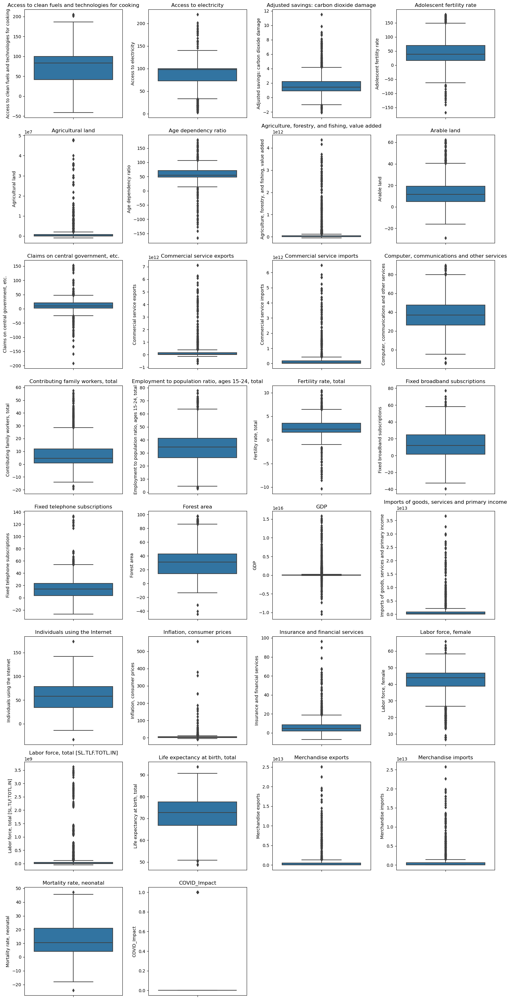

In [203]:
# 筛选数值型数据
numeric_data = data_attribute.select_dtypes(include=['float64', 'int64'])

# 绘图设置
num_columns = numeric_data.shape[1]
num_rows = (num_columns + 3) // 4  # 计算需要的行数
plt.figure(figsize=(16, 4 * num_rows))  # 设置画布大小

# 绘制箱型图
for i, column in enumerate(numeric_data.columns, 1):
    plt.subplot(num_rows, 4, i)
    sns.boxplot(y=numeric_data[column])
    plt.title(column)

plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/20.png", format='png')
plt.show()

In [51]:
#data5在后面定义的
numeric_data =data_attribute.select_dtypes(include=['float64', 'int64'])
def outliers_iqr(data):
    Q1 = data.quantile(0.05)
    Q3 = data.quantile(0.95)
    IQR = Q3 - Q1
    outliers_mask = (data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))
    return outliers_mask

print("\nOutliers detected by IQR Method:")
for column in numeric_data.columns:
    mask = outliers_iqr(numeric_data[column])
    print(f"{column} ： {mask.sum()} ")


Outliers detected by IQR Method:
Access to clean fuels and technologies for cooking ： 0 
Access to electricity ： 1 
Adjusted savings: carbon dioxide damage ： 1 
Adolescent fertility rate ： 0 
Agricultural land ： 38 
Age dependency ratio ： 17 
Agriculture, forestry, and fishing, value added ： 52 
Arable land ： 0 
Claims on central government, etc. ： 14 
Commercial service exports ： 54 
Commercial service imports ： 55 
Computer, communications and other services ： 0 
Contributing family workers, total ： 0 
Employment to population ratio, ages 15-24, total ： 0 
Fertility rate, total ： 13 
Fixed broadband subscriptions ： 0 
Fixed telephone subscriptions ： 9 
Forest area ： 0 
GDP ： 59 
Imports of goods, services and primary income ： 40 
Individuals using the Internet ： 0 
Inflation, consumer prices ： 34 
Insurance and financial services ： 25 
Labor force, female ： 0 
Labor force, total [SL.TLF.TOTL.IN] ： 50 
Life expectancy at birth, total ： 0 
Merchandise exports ： 41 
Merchandise imports

In [52]:
def replace_with_nearest(data, mask):
    import numpy as np
    normal_values = data[~mask]  # 非异常值
    for idx in data[mask].index:
        closest_idx = np.abs(normal_values - data.loc[idx]).idxmin()
        closest_value = data.loc[closest_idx]
        data.at[idx] = closest_value
    return data



numeric_data = data_attribute.select_dtypes(include=['float64', 'int64'])


def outliers_iqr(data):
    Q1 = data.quantile(0.05)
    Q3 = data.quantile(0.95)
    IQR = Q3 - Q1
    outliers_mask = (data < (Q1 - 1.5 * IQR)) | (data > (Q3 + 1.5 * IQR))
    return outliers_mask


for column in numeric_data.columns:
    mask = outliers_iqr(numeric_data[column])
    numeric_data[column] = replace_with_nearest(numeric_data[column], mask)

print("\nAfter processing outliers:")
print(numeric_data)
data5.update(numeric_data)



After processing outliers:
      Access to clean fuels and technologies for cooking  \
0                                             24.300000    
1                                             72.300000    
2                                             99.400000    
3                                            130.747075    
4                                            100.000000    
...                                                 ...    
2658                                          35.631847    
2659                                           9.633714    
2660                                          69.933050    
2663                                                NaN    
2664                                                NaN    

      Access to electricity  Adjusted savings: carbon dioxide damage  \
0                 68.040878                                 0.938296   
1                 99.890312                                 1.104330   
2                 99.187927        

NameError: name 'data5' is not defined

# 3.3 - 必须通过创建新功能/变量和/或数据存储库/表来适当构建数据。

In [53]:
data_2013['Year'] = 2013
data_2015['Year'] = 2015
data_2016['Year'] = 2016
data_2017['Year'] = 2017
data_2018['Year'] = 2018
data_2019['Year'] = 2019
data_2020['Year'] = 2020
data_2021['Year'] = 2021
data_2022['Year'] = 2022
data_2023['Year'] = 2023

In [54]:
data_attribute['COVID_Impact'] = data_attribute['Year'].apply(lambda x: 1 if x in [2019,2020, 2021] else 0)
data_attribute

/var/folders/v9/8m1g4hpx7nzgxrn_lwlp6c2c0000gn/T/ipykernel_17345/4284528347.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_attribute['COVID_Impact'] = data_attribute['Year'].apply(lambda x: 1 if x in [2019,2020, 2021] else 0)


,Year,Time Code,Country,Country Code,Access to clean fuels and technologies for cooking,Access to electricity,Adjusted savings: carbon dioxide damage,Adolescent fertility rate,Agricultural land,Age dependency ratio,...,Individuals using the Internet,"Inflation, consumer prices",Insurance and financial services,"Labor force, female","Labor force, total [SL.TLF.TOTL.IN]","Life expectancy at birth, total",Merchandise exports,Merchandise imports,"Mortality rate, neonatal",COVID_Impact
0,2013,YR2013,Afghanistan,AFG,24.300000,68.040878,0.938296,106.537000,3.791000e+05,97.125534,...,5.900000,7.385772,5.826387,18.230563,7.881567e+06,62.417000,5.150000e+08,8.554000e+09,43.100000,0
1,2013,YR2013,Albania,ALB,72.300000,99.890312,1.104330,20.865000,1.187300e+04,46.586441,...,51.800000,1.937621,0.552222,41.853022,1.227940e+06,78.123000,2.339000e+09,4.920000e+09,5.900000,0
2,2013,YR2013,Algeria,DZA,99.400000,99.187927,2.185734,12.684000,4.143163e+05,49.534709,...,22.500000,3.254239,7.912973,18.713779,1.179370e+07,74.615000,6.497400e+10,5.502800e+10,16.500000,0
3,2013,YR2013,American Samoa,ASM,130.747075,99.288378,0.717202,43.498000,2.660000e+01,59.144144,...,98.731794,2.403206,6.615398,55.647592,2.646254e+06,81.442580,3.880000e+08,4.790000e+08,-0.954964,0
4,2013,YR2013,Andorra,AND,100.000000,100.000000,1.093647,6.989000,1.881000e+02,38.652083,...,84.400000,2.790863,14.078184,47.422997,-8.276349e+06,83.158277,5.419635e+11,5.972678e+11,2.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2658,2023,YR2023,Upper middle income,UMC,35.631847,50.478399,0.887671,105.280280,1.617787e+07,117.833555,...,23.357288,8.216272,7.243436,43.647700,1.440519e+09,64.990691,1.303170e+12,8.577667e+11,29.131740,0
2659,2023,YR2023,World,WLD,9.633714,32.402614,1.467271,141.679379,4.011658e+07,153.938996,...,-12.390852,7.502671,4.893768,40.080679,3.624639e+09,59.208132,2.433254e+12,1.235516e+12,45.338275,0
2660,NaN,NaN,NaN,NaN,69.933050,84.730185,1.724066,46.861607,1.948146e+06,58.880978,...,56.132956,5.760691,6.602522,41.270809,1.422261e+08,72.170920,6.321501e+11,6.333794e+11,12.879027,0
2663,Data from database: World Development Indicators,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


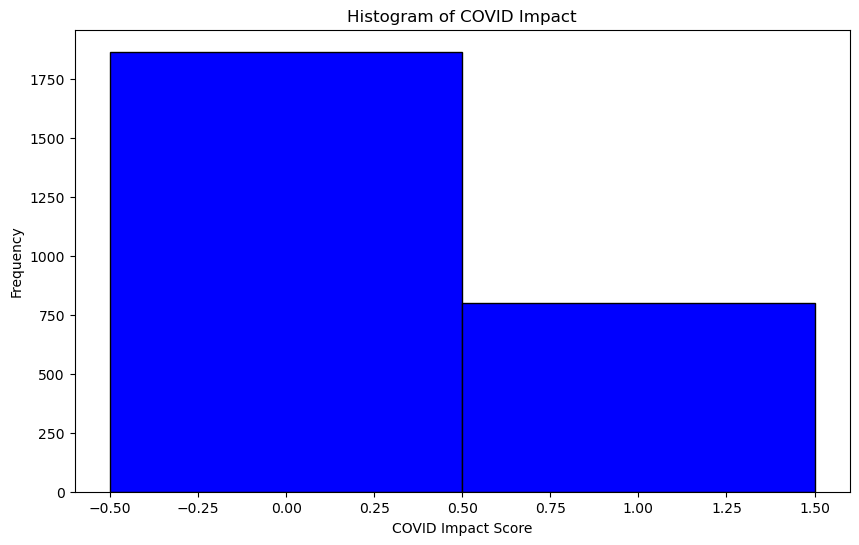

In [55]:
plt.figure(figsize=(10, 6))
plt.hist(data_attribute['COVID_Impact'], bins=[-0.5, 0.5, 1.5], color='blue', edgecolor='black')
plt.title('Histogram of COVID Impact')
plt.xlabel('COVID Impact Score')
plt.ylabel('Frequency')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/32.png", format='png')
plt.show()

# 3.4 - 必须进行整合。这包括有效合并来自各种来源的数据。

### Merging

### 写论文时，先写前面的年份数据合并再写这个属性数据合并

In [56]:
# 根据Year和Country列合并两个数据集
# 这里使用left join，意味着以combined_data的行为基准
data3 = pd.merge(combined_data, data_attribute, on=['Year', 'Country'], how='left')

data3

,Freedom,Generosity,Health (Life Expectancy),Country,Trust (Government Corruption),Year,Economy (GDP per Capita),Happiness Rank,Happiness Score,Time Code,...,Individuals using the Internet,"Inflation, consumer prices",Insurance and financial services,"Labor force, female","Labor force, total [SL.TLF.TOTL.IN]","Life expectancy at birth, total",Merchandise exports,Merchandise imports,"Mortality rate, neonatal",COVID_Impact
0,0.937,0.222,71.228,Denmark,0.176,2013,32333.000,1,7.693,YR2013,...,94.629700,0.789072,1.663780,47.556091,2850392.0,80.300000,1.109490e+11,9.734800e+10,3.000000,0.0
1,0.947,0.063,72.492,Norway,0.421,2013,48071.000,2,7.655,YR2013,...,95.053400,2.120486,5.754488,47.325287,2699916.0,81.751220,1.560220e+11,8.980800e+10,1.700000,0.0
2,0.918,0.129,73.561,Switzerland,0.319,2013,39476.000,3,7.650,YR2013,...,86.340000,-0.217323,23.515286,46.125748,4648458.0,82.797561,3.578520e+11,3.215090e+11,3.000000,0.0
3,0.908,0.312,72.338,Netherlands,0.378,2013,36854.000,4,7.512,YR2013,...,93.956400,2.506899,5.499115,46.336399,9054383.0,81.304878,6.715560e+11,5.896970e+11,2.700000,0.0
4,0.930,0.134,74.213,Sweden,0.226,2013,33869.000,5,7.480,YR2013,...,94.783600,-0.044293,6.610421,47.391815,5122087.0,81.956098,1.675500e+11,1.606090e+11,1.600000,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,0.375,0.086,0.105,Congo (Kinshasa),0.068,2023,0.531,133,3.207,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1520,0.363,-0.046,0.069,Zimbabwe,0.117,2023,0.758,134,3.204,YR2023,...,41.492099,10.429121,10.404454,50.027520,6560725.0,66.583850,5.612275e+11,6.097598e+11,22.177479,0.0
1521,0.371,0.105,0.092,Sierra Leone,0.051,2023,0.670,135,3.138,YR2023,...,58.827416,7.109508,9.005845,47.920784,2912540.0,71.041537,5.593399e+11,6.091289e+11,13.764889,0.0
1522,0.123,-0.141,0.398,Lebanon,0.027,2023,1.417,136,2.392,YR2023,...,77.367359,0.604218,2.646600,31.784673,1771423.0,79.212961,5.587495e+11,6.089315e+11,0.274039,0.0


# 3.5 - 重新格式化包括更改不同数据源的格式和修剪内容以及特定于数据的其他步骤

In [57]:
#data3['Happiness Ranking'] = data3['Happiness Ranking'].astype(int)

In [58]:
# 计算每列的缺失值数量
missing_values = data3.isnull().sum()

# 循环遍历每列的缺失值数量并打印
for column, missing_count in missing_values.items():
    print(f"{column}: {missing_count} ")


Freedom: 1 
Generosity: 1 
Health (Life Expectancy): 3 
Country: 0 
Trust (Government Corruption): 2 
Year: 0 
Economy (GDP per Capita): 0 
Happiness Rank: 0 
Happiness Score: 0 
Time Code: 77 
Country Code: 77 
Access to clean fuels and technologies for cooking: 77 
Access to electricity: 77 
Adjusted savings: carbon dioxide damage: 77 
Adolescent fertility rate: 77 
Agricultural land: 77 
Age dependency ratio: 77 
Agriculture, forestry, and fishing, value added: 77 
Arable land: 77 
Claims on central government, etc.: 77 
Commercial service exports: 77 
Commercial service imports: 77 
Computer, communications and other services: 77 
Contributing family workers, total: 77 
Employment to population ratio, ages 15-24, total: 77 
Fertility rate, total: 77 
Fixed broadband subscriptions: 77 
Fixed telephone subscriptions: 77 
Forest area: 77 
GDP: 77 
Imports of goods, services and primary income: 77 
Individuals using the Internet: 77 
Inflation, consumer prices: 77 
Insurance and financ

In [59]:
#data3[data3.isnull().any(axis=1)]
missing_count = data3.isnull().sum(axis=1)
#data3 = data3[missing_count <= 3]
data3[data3.isnull().any(axis=1)]
numeric_data = data3.select_dtypes(include=[np.number])
imputer = IterativeImputer(max_iter=10, random_state=0)
numeric_data_imputed = pd.DataFrame(imputer.fit_transform(numeric_data), columns=numeric_data.columns)
data3.update(numeric_data_imputed)



In [60]:
data3

,Freedom,Generosity,Health (Life Expectancy),Country,Trust (Government Corruption),Year,Economy (GDP per Capita),Happiness Rank,Happiness Score,Time Code,...,Individuals using the Internet,"Inflation, consumer prices",Insurance and financial services,"Labor force, female","Labor force, total [SL.TLF.TOTL.IN]","Life expectancy at birth, total",Merchandise exports,Merchandise imports,"Mortality rate, neonatal",COVID_Impact
0,0.937,0.222,71.228,Denmark,0.176,2013,32333.000,1,7.693,YR2013,...,94.629700,0.789072,1.663780,47.556091,2.850392e+06,80.300000,1.109490e+11,9.734800e+10,3.000000,0.000000
1,0.947,0.063,72.492,Norway,0.421,2013,48071.000,2,7.655,YR2013,...,95.053400,2.120486,5.754488,47.325287,2.699916e+06,81.751220,1.560220e+11,8.980800e+10,1.700000,0.000000
2,0.918,0.129,73.561,Switzerland,0.319,2013,39476.000,3,7.650,YR2013,...,86.340000,-0.217323,23.515286,46.125748,4.648458e+06,82.797561,3.578520e+11,3.215090e+11,3.000000,0.000000
3,0.908,0.312,72.338,Netherlands,0.378,2013,36854.000,4,7.512,YR2013,...,93.956400,2.506899,5.499115,46.336399,9.054383e+06,81.304878,6.715560e+11,5.896970e+11,2.700000,0.000000
4,0.930,0.134,74.213,Sweden,0.226,2013,33869.000,5,7.480,YR2013,...,94.783600,-0.044293,6.610421,47.391815,5.122087e+06,81.956098,1.675500e+11,1.606090e+11,1.600000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,0.375,0.086,0.105,Congo (Kinshasa),0.068,2023,0.531,133,3.207,NaN,...,6213.482629,6.675065,582.928619,576.233135,2.314334e+07,-4368.486315,1.684124e+11,1.742328e+11,6397.315984,1007.042798
1520,0.363,-0.046,0.069,Zimbabwe,0.117,2023,0.758,134,3.204,YR2023,...,41.492099,10.429121,10.404454,50.027520,6.560725e+06,66.583850,5.612275e+11,6.097598e+11,22.177479,0.000000
1521,0.371,0.105,0.092,Sierra Leone,0.051,2023,0.670,135,3.138,YR2023,...,58.827416,7.109508,9.005845,47.920784,2.912540e+06,71.041537,5.593399e+11,6.091289e+11,13.764889,0.000000
1522,0.123,-0.141,0.398,Lebanon,0.027,2023,1.417,136,2.392,YR2023,...,77.367359,0.604218,2.646600,31.784673,1.771423e+06,79.212961,5.587495e+11,6.089315e+11,0.274039,0.000000


# 4.1 - 必须通过选择与预测变量相关的特征（水平缩减）和/或垂直缩减来缩减数据。这可以通过使用特征选择/逻辑过程来实现。

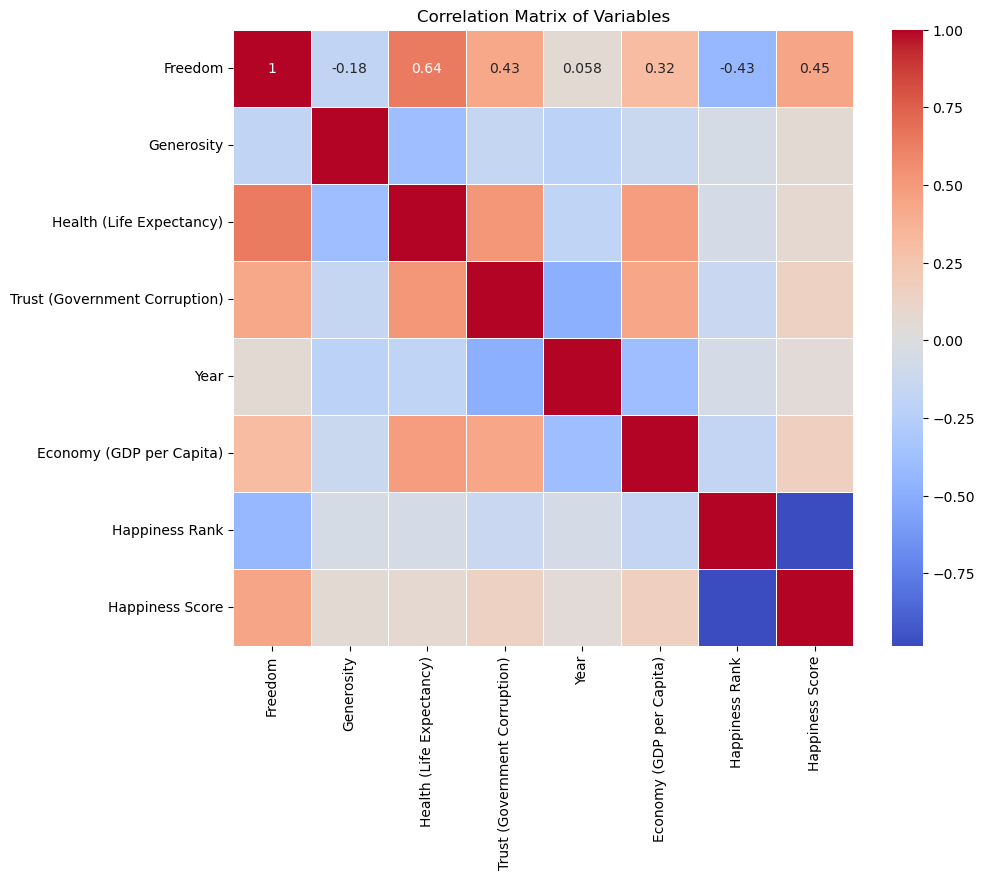

In [61]:
#2. 相关矩阵（Correlation Matrix）
plt.figure(figsize=(10, 8))
data1=combined_data.drop(columns=['Country'])
correlation_matrix = data1.corr()
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('Correlation Matrix of Variables')
plt.show()


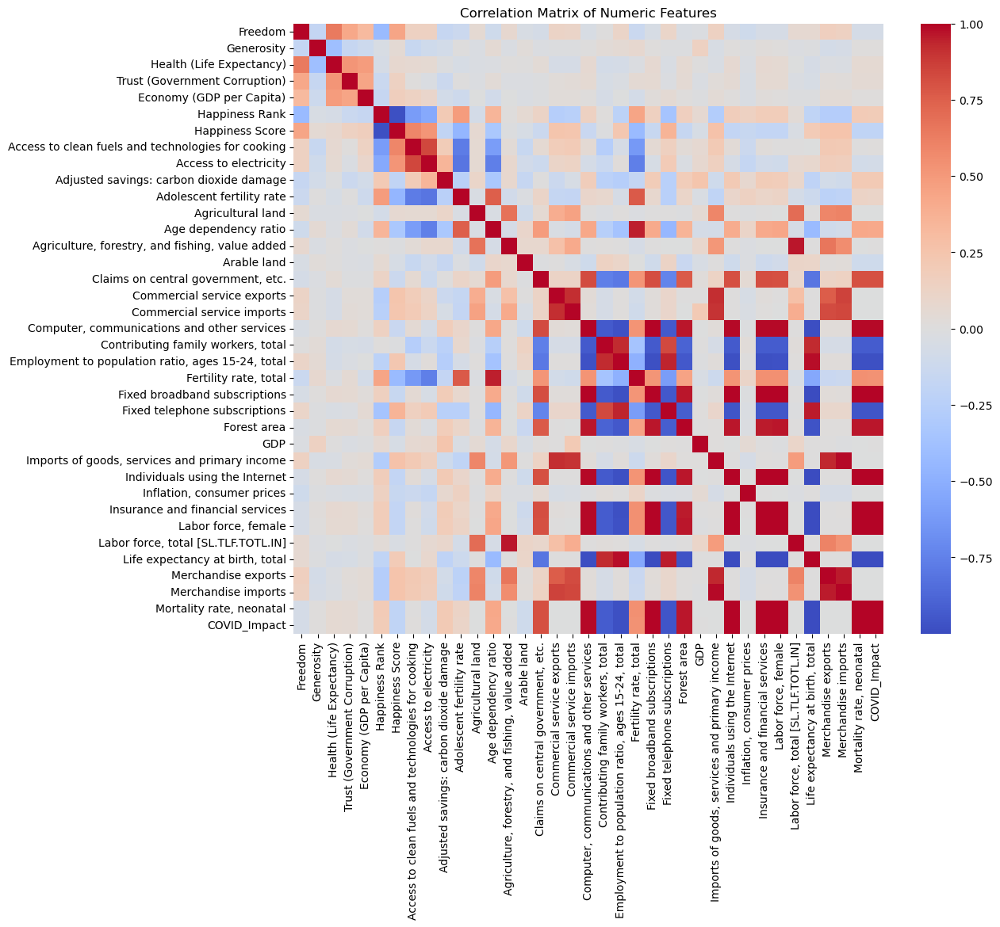

In [62]:
# 选择数值型数据
numeric_data = data3.select_dtypes(include=[np.number])  # 包括int和float

# 计算相关系数矩阵
correlation_matrix = numeric_data.corr()

# 绘制热图
plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, annot=False, fmt=".2f", cmap='coolwarm')
plt.title("Correlation Matrix of Numeric Features")
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/39.png", format='png')
plt.show()

In [66]:
from sklearn.feature_selection import SelectKBest, f_regression
data4=data3
data3.drop('Happiness Rank', axis=1, inplace=True)
numeric_data = data3.select_dtypes(include=[np.number])  # 包括int和float
# 假设data3是你的DataFrame，'Happiness Score'是目标变量
X = numeric_data.drop('Happiness Score', axis=1)  # 删除目标变量列
y = data3['Happiness Score']

# 选择最佳的K个特征
selector = SelectKBest(score_func=f_regression, k=15)  # 选择10个最重要的特征
X_new = selector.fit_transform(X, y)

# 查看所选特征
selected_features = pd.DataFrame(selector.inverse_transform(X_new), 
                                 index=data3.index, 
                                 columns=X.columns)
selected_columns = selected_features.columns[selector.get_support()]
print("Selected features based on f_regression:", selected_columns)


Selected features based on f_regression: Index(['Freedom', 'Access to clean fuels and technologies for cooking',
       'Access to electricity', 'Adolescent fertility rate',
       'Age dependency ratio', 'Commercial service exports',
       'Commercial service imports',
       'Employment to population ratio, ages 15-24, total',
       'Fertility rate, total', 'Fixed telephone subscriptions',
       'Imports of goods, services and primary income',
       'Life expectancy at birth, total', 'Merchandise exports',
       'Merchandise imports', 'Mortality rate, neonatal'],
      dtype='object')


In [67]:
from sklearn.ensemble import RandomForestRegressor

model = RandomForestRegressor()
model.fit(X, y)

feature_importances = pd.Series(model.feature_importances_, index=X.columns)
selected_features = feature_importances.nlargest(25) 
print("Most important features based on RandomForest:\n", selected_features)


Most important features based on RandomForest:
 Fixed telephone subscriptions                         0.319598
Mortality rate, neonatal                              0.133579
Adjusted savings: carbon dioxide damage               0.066589
Employment to population ratio, ages 15-24, total     0.059755
Individuals using the Internet                        0.056188
Economy (GDP per Capita)                              0.038642
Health (Life Expectancy)                              0.029989
Life expectancy at birth, total                       0.027568
Freedom                                               0.024416
Labor force, female                                   0.022524
Fixed broadband subscriptions                         0.021563
Merchandise exports                                   0.017606
Access to electricity                                 0.015593
Contributing family workers, total                    0.013293
Trust (Government Corruption)                         0.012795
Access 

In [68]:
selected_features = feature_importances.nlargest(20)
X = X[selected_features.index]
non_numeric_data = data3.select_dtypes(exclude=[np.number])
data5 = pd.concat([X, y, non_numeric_data], axis=1)

In [69]:
data5

,Fixed telephone subscriptions,"Mortality rate, neonatal",Adjusted savings: carbon dioxide damage,"Employment to population ratio, ages 15-24, total",Individuals using the Internet,Economy (GDP per Capita),Health (Life Expectancy),"Life expectancy at birth, total",Freedom,"Labor force, female",...,Access to clean fuels and technologies for cooking,"Computer, communications and other services",Adolescent fertility rate,GDP,"Claims on central government, etc.",Happiness Score,Country,Year,Time Code,Country Code
0,37.233956,3.000000,0.364416,49.541000,94.629700,32333.000,71.228,80.300000,0.937,47.556091,...,100.000000,31.380313,4.247000,1.958036e+12,-6.781964,7.693,Denmark,2013,YR2013,DNK
1,24.341248,1.700000,0.241676,51.829000,95.053400,48071.000,72.492,81.751220,0.947,47.325287,...,100.000000,40.669934,5.517000,3.011427e+12,-12.949340,7.655,Norway,2013,YR2013,NOR
2,56.789226,3.000000,0.193660,62.057000,86.340000,39476.000,73.561,82.797561,0.918,46.125748,...,100.000000,68.503858,3.207000,6.421091e+11,4.178211,7.650,Switzerland,2013,YR2013,CHE
3,42.244248,2.700000,0.583064,60.104000,93.956400,36854.000,72.338,81.304878,0.908,46.336399,...,100.000000,66.476677,3.955000,6.672517e+11,7.269749,7.512,Netherlands,2013,YR2013,NLD
4,40.713573,1.600000,0.218404,41.696000,94.783600,33869.000,74.213,81.956098,0.930,47.391815,...,100.000000,52.474786,5.765000,3.971859e+12,-1.225975,7.480,Sweden,2013,YR2013,SWE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,-221.045416,6397.315984,1.203716,-306.108595,6213.482629,0.531,0.105,-4368.486315,0.375,576.233135,...,98.841999,625.358243,22.472746,2.204626e+14,164.782071,3.207,Congo (Kinshasa),2023,NaN,NaN
1520,26.749792,22.177479,-0.258865,41.857000,41.492099,0.758,0.069,66.583850,0.363,50.027520,...,44.489038,49.180413,103.866957,-9.995583e+13,34.109507,3.204,Zimbabwe,2023,YR2023,ZWE
1521,25.471995,13.764889,0.987142,30.053000,58.827416,0.670,0.092,71.041537,0.371,47.920784,...,74.223064,45.585418,61.823439,-1.150798e+14,19.976137,3.138,Sierra Leone,2023,YR2023,SLE
1522,5.844142,0.274039,3.884595,27.142000,77.367359,1.417,0.398,79.212961,0.123,31.784673,...,102.143443,22.069069,-22.210611,-1.198105e+14,-18.398993,2.392,Lebanon,2023,YR2023,LBN


In [70]:
# Define a dictionary with old column names as keys and new column names as values
new_column_names = {
    'Fixed broadband subscriptions': 'Fixed_Broadband',
    'Fixed telephone subscriptions': 'Fixed_Telephone',
    'Economy (GDP per Capita)': 'GDP_per_Capita',
    'Employment to population ratio, ages 15-24, total': 'Youth_Emp_Ratio',
    'Health (Life Expectancy)': 'Health_Life_Exp',
    'Adjusted savings: carbon dioxide damage': 'CO2_Damage',
    'Freedom': 'Freedom',
    'Individuals using the Internet': 'Internet_Users',
    'Life expectancy at birth, total': 'Life_Expectancy',
    'Labor force, female': 'Female_Labor_Force',
    'Trust (Government Corruption)': 'Gov_Trust',
    'Mortality rate, neonatal': 'Neonatal_Mortality',
    'Access to electricity': 'Electricity_Access',
    'Agriculture, forestry, and fishing, value added': 'Agri_Value_Added',
    'Computer, communications and other services': 'Tech_Services',
    'Merchandise exports': 'Merch_Exports',
    'GDP': 'GDP_Total',
    'Insurance and financial services': 'Insur_Fin_Services',
    'Adolescent fertility rate': 'Adol_Fertility',
    'Labor force, total [SL.TLF.TOTL.IN]': 'Total_Labor_Force',
    'Happiness Score': 'Happiness Score',
    'Country': 'Country',
    'Year': 'Year',
    'Time Code': 'Time_Code',
    'Country Code': 'Country_Code'
}

data5.rename(columns=new_column_names, inplace=True)
data5

,Fixed_Telephone,Neonatal_Mortality,CO2_Damage,Youth_Emp_Ratio,Internet_Users,GDP_per_Capita,Health_Life_Exp,Life_Expectancy,Freedom,Female_Labor_Force,...,Access to clean fuels and technologies for cooking,Tech_Services,Adol_Fertility,GDP_Total,"Claims on central government, etc.",Happiness Score,Country,Year,Time_Code,Country_Code
0,37.233956,3.000000,0.364416,49.541000,94.629700,32333.000,71.228,80.300000,0.937,47.556091,...,100.000000,31.380313,4.247000,1.958036e+12,-6.781964,7.693,Denmark,2013,YR2013,DNK
1,24.341248,1.700000,0.241676,51.829000,95.053400,48071.000,72.492,81.751220,0.947,47.325287,...,100.000000,40.669934,5.517000,3.011427e+12,-12.949340,7.655,Norway,2013,YR2013,NOR
2,56.789226,3.000000,0.193660,62.057000,86.340000,39476.000,73.561,82.797561,0.918,46.125748,...,100.000000,68.503858,3.207000,6.421091e+11,4.178211,7.650,Switzerland,2013,YR2013,CHE
3,42.244248,2.700000,0.583064,60.104000,93.956400,36854.000,72.338,81.304878,0.908,46.336399,...,100.000000,66.476677,3.955000,6.672517e+11,7.269749,7.512,Netherlands,2013,YR2013,NLD
4,40.713573,1.600000,0.218404,41.696000,94.783600,33869.000,74.213,81.956098,0.930,47.391815,...,100.000000,52.474786,5.765000,3.971859e+12,-1.225975,7.480,Sweden,2013,YR2013,SWE
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,-221.045416,6397.315984,1.203716,-306.108595,6213.482629,0.531,0.105,-4368.486315,0.375,576.233135,...,98.841999,625.358243,22.472746,2.204626e+14,164.782071,3.207,Congo (Kinshasa),2023,NaN,NaN
1520,26.749792,22.177479,-0.258865,41.857000,41.492099,0.758,0.069,66.583850,0.363,50.027520,...,44.489038,49.180413,103.866957,-9.995583e+13,34.109507,3.204,Zimbabwe,2023,YR2023,ZWE
1521,25.471995,13.764889,0.987142,30.053000,58.827416,0.670,0.092,71.041537,0.371,47.920784,...,74.223064,45.585418,61.823439,-1.150798e+14,19.976137,3.138,Sierra Leone,2023,YR2023,SLE
1522,5.844142,0.274039,3.884595,27.142000,77.367359,1.417,0.398,79.212961,0.123,31.784673,...,102.143443,22.069069,-22.210611,-1.198105e+14,-18.398993,2.392,Lebanon,2023,YR2023,LBN


# 4.2 - 数据必须通过使用统计变换（例如取分布的对数）来预测。

In [73]:
from sklearn.preprocessing import PowerTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.neighbors import NearestNeighbors
numeric_data = data5.select_dtypes(include=[np.number])  # 包括int和float
pt = PowerTransformer(method='yeo-johnson')
data_transformed = pt.fit_transform(numeric_data.values.reshape(-1, 1))


In [74]:
#stander
scaler = StandardScaler()
data_transformed= scaler.fit_transform(data_transformed)
data5.update(data_transformed)

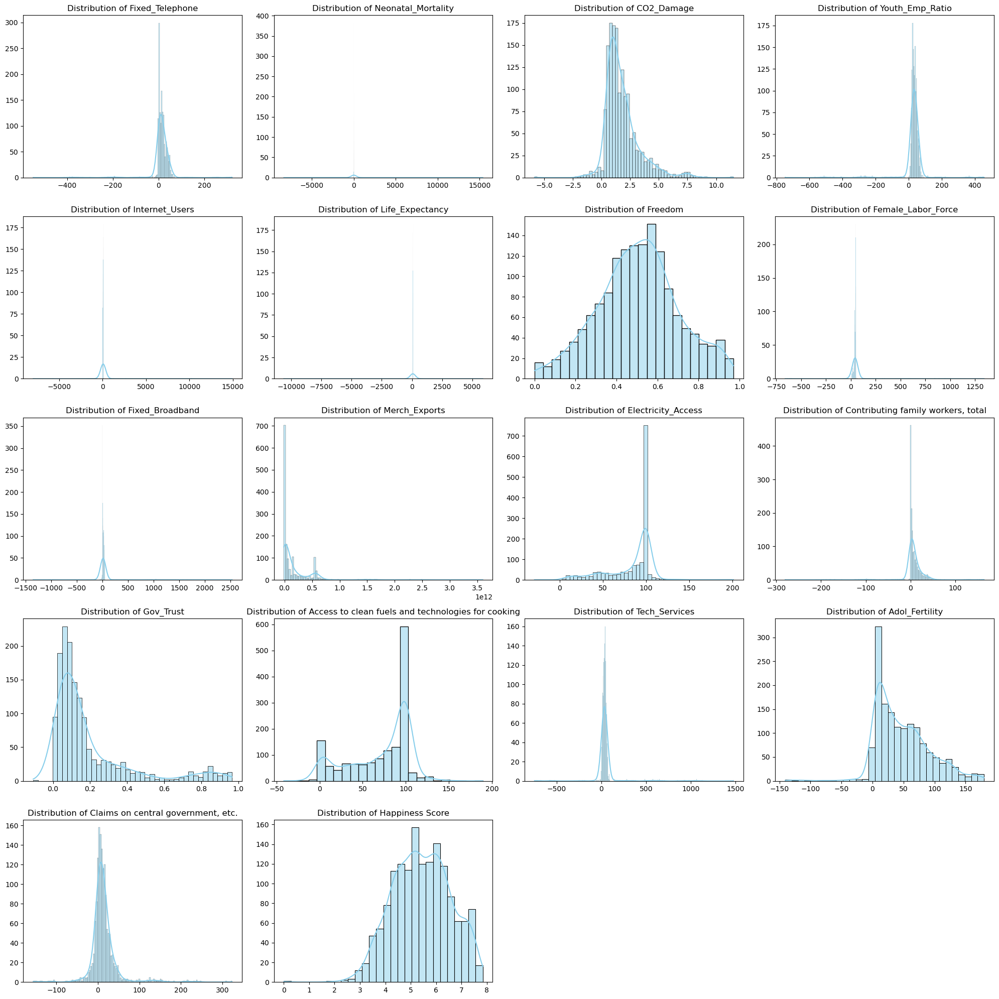

In [76]:
data5_new = data5.drop(['GDP_per_Capita', 'Health_Life_Exp', 'GDP_Total'], axis=1)
#, 'Total_Labor_Force', 'Agri_Value_Added'

# 选择数据类型为数值的列
numeric_cols = data5_new.select_dtypes(include=['int64', 'float64'])
# 设定每行显示的图形数
n_cols = 4
n_rows = (len(numeric_cols.columns) + n_cols - 1) // n_cols  # 确保有足够的行来展示所有图形

# 创建一个足够大的画布来容纳所有的直方图
plt.figure(figsize=(n_cols * 5, n_rows * 4))  # 宽度为5*n_cols, 高度为4*n_rows

for i, column in enumerate(numeric_cols.columns, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(data5_new[column], kde=True, color='skyblue')
    plt.title(f'Distribution of {column}')
    plt.xlabel('')
    plt.ylabel('')

plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/44.png", format='png')
plt.show()

# 6.1 在 DM 目标的背景下对 DM 算法进行探索性分析。然后，讨论分析。

# 6.2 - 根据探索性分析和讨论以逻辑方式选择算法。

# 6.3 - 必须选择/构建模型，并且必须选择适当的算法/模型参数。

In [77]:
data5['COVID_Impact'] = data5['Year'].apply(lambda x: 1 if x in [2020, 2021] else 0)
covid_impact_dummies = pd.get_dummies(data5['COVID_Impact'], prefix='COVID_Impact')
data5 = pd.concat([data5, covid_impact_dummies], axis=1)
data5 = data5.drop('COVID_Impact', axis=1)

from sklearn.preprocessing import RobustScaler
scaler = RobustScaler()
data_transformed = scaler.fit_transform(numeric_data)
numeric_data.update(data_transformed)
#numeric_data = data5.select_dtypes(include=[np.number]) 
X = numeric_data.drop('Happiness Score', axis=1)
X = pd.concat([X, covid_impact_dummies], axis=1)
y = data5['Happiness Score']


In [97]:
X

,Fixed broadband subscriptions (per 100 people) [IT.NET.BBND.P2],"Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]",GDP_per_Capita,Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS],Fixed telephone subscriptions (per 100 people) [IT.MLT.MAIN.P2],"Life expectancy at birth, total (years) [SP.DYN.LE00.IN]","Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS]",Individuals using the Internet (% of population) [IT.NET.USER.ZS],Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS],Health_Life_Exp,...,Freedom,"Labor force, female (% of total labor force) [SL.TLF.TOTL.FE.ZS]","Contributing family workers, total (% of total employment) (modeled ILO estimate) [SL.FAM.WORK.ZS]",GDP (constant LCU) [NY.GDP.MKTP.KN],"Computer, communications and other services (% of commercial service imports) [TM.VAL.OTHR.ZS.WT]","Adolescent fertility rate (births per 1,000 women ages 15-19) [SP.ADO.TFRT]",Gov_Trust,Arable land (% of land area) [AG.LND.ARBL.ZS],COVID_Impact_0,COVID_Impact_1
0,1.904754,-0.867753,5.208080,-1.048866,1.261483,1.098168,0.997211,1.366257,0.829650,2.348194,...,2.178852,0.557582,-0.780399,-1.548065e-01,-0.259997,-1.080435,-0.087451,3.469493,True,False
1,1.698892,-0.984577,7.851354,-1.140151,0.479654,1.295575,1.154688,1.381533,0.829650,2.398999,...,2.229497,0.537678,-0.779492,-1.540539e-01,0.248168,-1.048533,1.007070,-1.087937,True,False
2,2.060649,-0.867753,6.407782,-1.175861,2.447337,1.437907,1.858652,1.067362,0.829650,2.441965,...,2.082627,0.434230,-0.594856,-1.557466e-01,1.770752,-1.106559,0.551392,-0.460285,True,False
3,1.895277,-0.894712,5.967404,-0.886253,1.565313,1.234860,1.724232,1.341980,0.829650,2.392809,...,2.031983,0.452397,-0.750735,-1.557287e-01,1.659860,-1.087770,0.814970,1.160987,True,False
4,1.330690,-0.993564,5.466059,-1.157459,1.472491,1.323444,0.457262,1.371806,0.829650,2.468171,...,2.143401,0.543415,-0.778665,-1.533678e-01,0.893922,-1.042304,0.135920,-0.762304,True,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1519,-0.389586,0.501228,-0.222316,0.054778,0.730799,-0.272445,-0.572533,-0.023933,-0.042961,-0.510466,...,-0.667373,-0.977840,0.242928,7.561804e-14,0.508327,0.009855,-0.569934,-0.066370,True,False
1520,0.381996,0.273594,-0.222278,-1.015558,0.499953,-0.378927,0.468343,-0.361043,-0.449073,-0.511913,...,-0.728147,0.770717,0.146013,-2.288882e-01,0.389745,0.751448,-0.351030,0.035997,True,False
1521,0.389580,-0.160139,-0.222293,-0.384898,0.392231,-0.018214,-0.344092,0.154244,0.134210,-0.510988,...,-0.687631,0.589033,-0.284874,-2.397024e-01,0.342302,0.022395,-0.645881,-0.025977,True,False
1522,-0.440534,-0.363252,-0.222167,0.948451,-0.526409,0.437469,-0.544448,0.463535,0.483585,-0.498689,...,-1.943617,-0.802536,-0.236556,-2.430849e-01,-0.409690,-0.914843,-0.753099,-0.409818,True,False


# 1.问题一

In [33]:
from sklearn.linear_model import Lasso
from sklearn.model_selection import GridSearchCV
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)

alpha_range = [1e-4, 1e-3, 1e-2, 1e-1, 1, 10, 100, 1000]

lasso = Lasso()
lasso_cv = GridSearchCV(estimator=lasso, param_grid={'alpha': alpha_range}, scoring='neg_mean_squared_error', cv=5)
lasso_cv.fit(X, y)
print(f"Best alpha: {lasso_cv.best_params_['alpha']}")
print(f"MSE: {lasso_cv.best_score_}")
model = lasso_cv.best_estimator_



Best alpha: 0.1
MSE: -0.49221851739331335


# 2.问题二

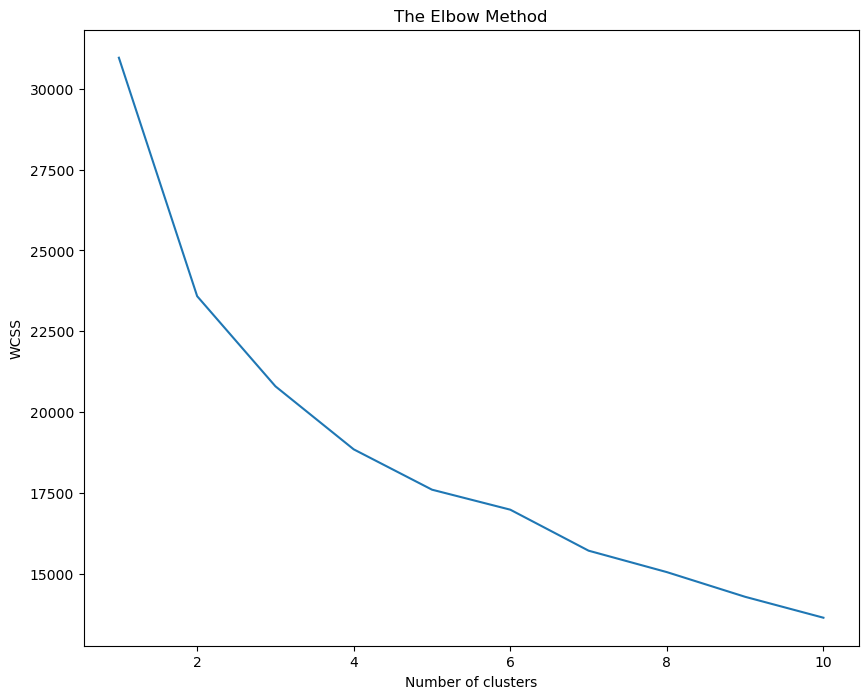

In [98]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt


wcss = []
for i in range(1, 11):  # try1 to10 cluster
    kmeans = KMeans(n_clusters=i, init='k-means++', max_iter=300, n_init=10, random_state=0)
    kmeans.fit(X)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 8))
plt.plot(range(1, 11), wcss)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/46.png", format='png')
plt.show()


In [99]:
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)

# 3.问题三

In [106]:
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures


# 使用PolynomialFeatures仅对训练数据进行转换
interaction = PolynomialFeatures(degree=2, interaction_only=True, include_bias=False)
features = X_train.columns
X_train_interactions = interaction.fit_transform(X_train)
interaction_features = interaction.get_feature_names_out(features)
X_train_interactions_df = pd.DataFrame(X_train_interactions, columns=interaction_features)

model3 = LinearRegression()




# 7.1 - 必须创建逻辑测试设计。证明为什么使用特定的测试设计（例如，为什么使用 70/30 的训练/测试分割？）。

In [100]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score
numeric_data = data5.select_dtypes(include=[np.number]) 
#X = numeric_data.drop('Happiness Score', axis=1)
#y = data5['Happiness Score']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)
X_test.shape[0]

458

In [101]:
X_train

,Fixed broadband subscriptions (per 100 people) [IT.NET.BBND.P2],"Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]",GDP_per_Capita,Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS],Fixed telephone subscriptions (per 100 people) [IT.MLT.MAIN.P2],"Life expectancy at birth, total (years) [SP.DYN.LE00.IN]","Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS]",Individuals using the Internet (% of population) [IT.NET.USER.ZS],Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS],Health_Life_Exp,...,Freedom,"Labor force, female (% of total labor force) [SL.TLF.TOTL.FE.ZS]","Contributing family workers, total (% of total employment) (modeled ILO estimate) [SL.FAM.WORK.ZS]",GDP (constant LCU) [NY.GDP.MKTP.KN],"Computer, communications and other services (% of commercial service imports) [TM.VAL.OTHR.ZS.WT]","Adolescent fertility rate (births per 1,000 women ages 15-19) [SP.ADO.TFRT]",Gov_Trust,Arable land (% of land area) [AG.LND.ARBL.ZS],COVID_Impact_0,COVID_Impact_1
1371,-2.007670,1.718750,-0.222289,0.980025,-1.504188,-1.329977,-1.386135,-1.364127,-0.784704,-0.499252,...,-0.895274,-2.882892,0.233518,0.245983,-1.297142,0.976056,-0.435911,-0.536945,True,False
126,-1.186266,2.151712,-0.063016,-0.808946,-0.982497,-2.164747,-0.531096,-1.901498,-1.998637,0.675675,...,1.221670,0.757650,-0.110135,-0.156198,0.798002,2.156831,3.075491,0.462809,True,False
327,-0.123874,-0.580185,-0.222226,-0.937231,0.031604,0.983768,-0.117032,0.329670,0.676155,-0.484081,...,0.230302,-0.222188,-0.601017,-0.132649,-0.149577,0.144982,-0.402539,-0.871582,True,False
292,-1.037860,1.621509,-0.222278,-0.331170,-0.935000,-1.574111,0.101495,-1.252488,-0.665505,-0.507981,...,-2.040652,0.754255,-0.277273,-0.155045,1.918590,2.532389,-0.555549,-0.938704,True,False
1058,-0.982411,0.570088,-0.222325,-0.601270,-0.988653,-1.299334,0.082774,-1.125104,-1.396027,-0.493130,...,0.062823,0.719759,1.689937,-0.149966,0.785169,0.444101,-0.573503,-0.460779,False,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1130,-1.047063,1.217116,-0.222343,-0.661652,-0.951795,-0.986468,2.093559,-1.443654,-1.799662,1.856712,...,1.241927,0.481867,2.191133,-0.154613,-1.135882,0.551662,-0.364432,-0.125550,False,True
1294,-0.742240,0.225591,-0.222219,0.177893,-0.755827,-0.341562,0.842281,-0.346584,-0.584221,-0.492379,...,0.380970,-0.133332,-0.189208,-0.156037,-1.093041,0.292202,-0.534195,-0.133654,True,False
860,0.180704,-0.661063,-0.222207,0.291038,-0.158676,0.762449,-0.120817,0.621590,0.698895,-0.482210,...,-1.578976,-0.743668,0.202136,-0.154940,0.297595,-0.702566,-0.400172,0.737972,True,False
1459,-0.098927,0.146974,-0.222148,-0.230343,-0.034602,-0.107517,0.335851,-0.171225,-0.234786,-0.500578,...,0.588612,-0.039418,0.165223,-0.232621,-0.047176,0.193521,-0.002570,-0.187699,True,False


# 7.2 - 必须进行数据挖掘（模型必须运行）。

# 1.Object 1

In [40]:
model.fit(X_train, y_train)

Lasso(alpha=0.1)

# 2.Object 2

In [102]:
kmeans.fit(X)

KMeans(n_clusters=3, n_init=10, random_state=0)

# 3.Object 3

In [103]:
model3.fit(X_train_interactions_df, y_train)

LinearRegression()

# 7.3 - 搜索模式并记录模型的输出。

# 1.问题一

In [50]:
import statsmodels.api as sm
X1 = sm.add_constant(X)  # 添加截距项
# 假设 y 是你的目标变量，X 是包含截距项的特征矩阵
model_1 = sm.OLS(y, X1).fit()
# 打印出完整的统计摘要
model_1.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:        Happiness Score   R-squared:                       0.638
Model:                            OLS   Adj. R-squared:                  0.635
Method:                 Least Squares   F-statistic:                     204.7
Date:                Mon, 29 Apr 2024   Prob (F-statistic):          1.29e-321
Time:                        13:08:14   Log-Likelihood:                -1566.1
No. Observations:                1524   AIC:                             3160.
Df Residuals:                    1510   BIC:                             3235.
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
======================================================================================================================================================================
                                                                                                         coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------------------------------------------------------------------------
const                                                                                                  0.0005   3.25e-05     13.969      0.000       0.000       0.001
Fixed broadband subscriptions (per 100 people) [IT.NET.BBND.P2]                                        0.0229      0.003      7.267      0.000       0.017       0.029
Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]                                         0.0106      0.004      3.025      0.003       0.004       0.017
Fixed telephone subscriptions (per 100 people) [IT.MLT.MAIN.P2]                                        0.0006      0.002      0.353      0.724      -0.003       0.004
Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS]                                -0.0013      0.000     -5.178      0.000      -0.002      -0.001
GDP_per_Capita                                                                                      1.046e-05   3.51e-06      2.978      0.003    3.57e-06    1.74e-05
Life expectancy at birth, total (years) [SP.DYN.LE00.IN]                                               0.0384      0.003     12.939      0.000       0.033       0.044
Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS]       0.0190      0.002     12.118      0.000       0.016       0.022
Individuals using the Internet (% of population) [IT.NET.USER.ZS]                                      0.0075      0.002      4.902      0.000       0.005       0.011
Health_Life_Exp                                                                                        0.0004      0.001      0.541      0.589      -0.001       0.002
Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS]                 -0.0003      0.001     -0.214      0.830      -0.003       0.002
Freedom                                                                                                0.0002   1.16e-05     16.268      0.000       0.000       0.000
Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT]                                              -1.994e-14   5.97e-14     -0.334      0.739   -1.37e-13    9.72e-14
Access to electricity (% of population) [EG.ELC.ACCS.ZS]                                               0.0111      0.002      6.580      0.000       0.008       0.014
Labor force, female (% of total labor force) [SL.TLF.TOTL.FE.ZS]                                      -0.0025      0.002     -1.166      0.244      -0.007       0.002
Computer, communications and other services (% of commercial service imports)

In [44]:
# 获取模型系数和截距
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficients'])
intercept = model.intercept_

coefficients_sorted = coefficients.sort_values(by='Coefficients', ascending=False)

# 打印排序后的系数和截距
print("Coefficients:\n", coefficients_sorted)
print("Intercept:", intercept)


Coefficients:
                                                     Coefficients
Fixed broadband subscriptions (per 100 people) ...  2.691727e-02
Employment to population ratio, ages 15-24, tot...  1.845354e-02
Access to electricity (% of population) [EG.ELC...  1.268619e-02
Life expectancy at birth, total (years) [SP.DYN...  1.050606e-02
Individuals using the Internet (% of population...  8.011878e-03
Computer, communications and other services (% ...  5.908226e-03
Adolescent fertility rate (births per 1,000 wom...  4.882157e-03
Fixed telephone subscriptions (per 100 people) ...  9.301430e-04
Health_Life_Exp                                     9.735970e-05
GDP_per_Capita                                      1.251014e-05
Gov_Trust                                           0.000000e+00
Freedom                                             0.000000e+00
Mortality rate, neonatal (per 1,000 live births...  0.000000e+00
Access to clean fuels and technologies for cook... -0.000000e+00
COVID_Impa

# 2.问题二

In [104]:
clusters = kmeans.fit_predict(X)
# 将聚类结果添加到未标准化的原始数据集中
numeric_data['Cluster'] = clusters
cluster_means = numeric_data.groupby('Cluster').mean()
cluster_means.T



Cluster,0,1,2
Fixed broadband subscriptions (per 100 people) [IT.NET.BBND.P2],1.312198,-0.970683,-0.202592
"Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]",-0.872421,1.282883,-0.187896
GDP_per_Capita,0.490302,-0.183821,-0.166210
Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS],-0.540909,-0.422786,0.499915
Fixed telephone subscriptions (per 100 people) [IT.MLT.MAIN.P2],1.033445,-0.833433,-0.124664
"Life expectancy at birth, total (years) [SP.DYN.LE00.IN]",1.035816,-1.327290,0.123978
"Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS]",0.222033,0.356659,-0.297862
Individuals using the Internet (% of population) [IT.NET.USER.ZS],0.978270,-1.301199,0.141201
Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS],0.821137,-1.500945,0.325351
Health_Life_Exp,0.399928,-0.069671,-0.176189


# 3.问题三

In [107]:
# 重置索引，确保数据对齐
X_train_interactions_df = X_train_interactions_df.reset_index(drop=True)
y_train = y_train.reset_index(drop=True)

# 现在重新添加常数项和拟合模型
X_train_interactions_sm = sm.add_constant(X_train_interactions_df)
model_sm = sm.OLS(y_train, X_train_interactions_sm).fit()

# 创建一个 DataFrame 来存储系数、p 值
results_df = pd.DataFrame({
    'Coefficients': model_sm.params,
    'P-values': model_sm.pvalues
})
results_df = results_df.sort_values(by='P-values', ascending=True)
# 过滤出包含 "COVID_Impact" 的系数
covid_impact_df = results_df[results_df.index.str.contains('COVID_Impact')]
covid_impact_df


,Coefficients,P-values
"Contributing family workers, total (% of total employment) (modeled ILO estimate) [SL.FAM.WORK.ZS] COVID_Impact_0",-0.262159,9.468561e-10
"Contributing family workers, total (% of total employment) (modeled ILO estimate) [SL.FAM.WORK.ZS] COVID_Impact_1",-0.236291,3.007956e-05
Access to electricity (% of population) [EG.ELC.ACCS.ZS] COVID_Impact_0,0.238833,3.428780e-04
Freedom COVID_Impact_0,0.115246,2.042013e-03
"Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS] COVID_Impact_0",0.073271,2.473079e-02
Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS] COVID_Impact_0,-0.082020,2.493406e-02
Gov_Trust COVID_Impact_1,0.175045,3.282482e-02
Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS] COVID_Impact_0,-0.150377,3.360577e-02
"Adolescent fertility rate (births per 1,000 women ages 15-19) [SP.ADO.TFRT] COVID_Impact_1",0.174618,4.337609e-02
Access to electricity (% of population) [EG.ELC.ACCS.ZS] COVID_Impact_1,0.159161,6.286451e-02


In [108]:
X_test_interactions = interaction.transform(X_test)
X_test_interactions_df = pd.DataFrame(X_test_interactions, columns=interaction_features)
y_pred = model3.predict(X_test_interactions_df)

mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f'Mean Squared Error: {mse}')
print(f'R^2 Score: {r2}')

NotFittedError: This LinearRegression instance is not fitted yet. Call 'fit' with appropriate arguments before using this estimator.

782     7.7690
76      5.3450
1009    5.5461
1402    6.8920
846     5.6970
         ...  
1358    4.5430
973     6.3048
377     5.7430
286     4.2920
1462    5.5230
Name: Happiness Score, Length: 458, dtype: float64

# 8.1 - 研究和讨论挖掘的模式。对数据、结果、模型和模式进行深入讨论。

# 1.问题一

# 2.问题二

# 3.问题三

# 8.2 - 以清晰有效的方式可视化数据、结果、模型和模式。

# 1.问题一

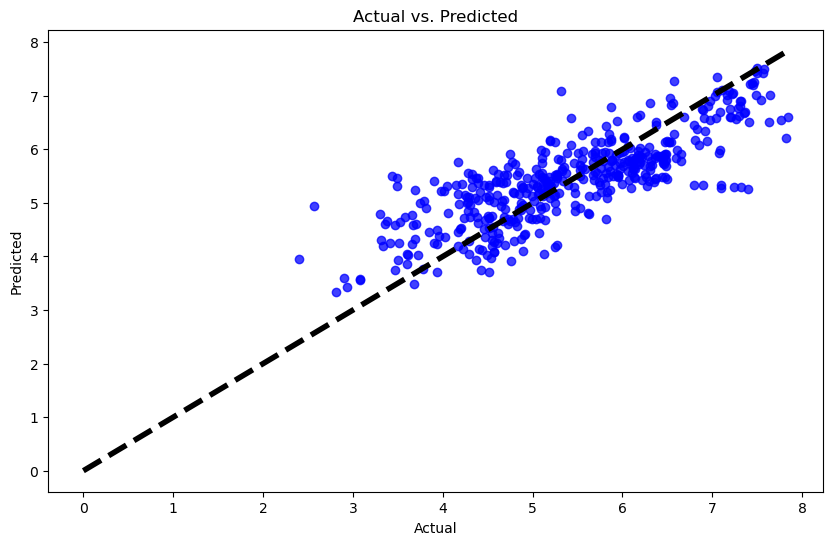

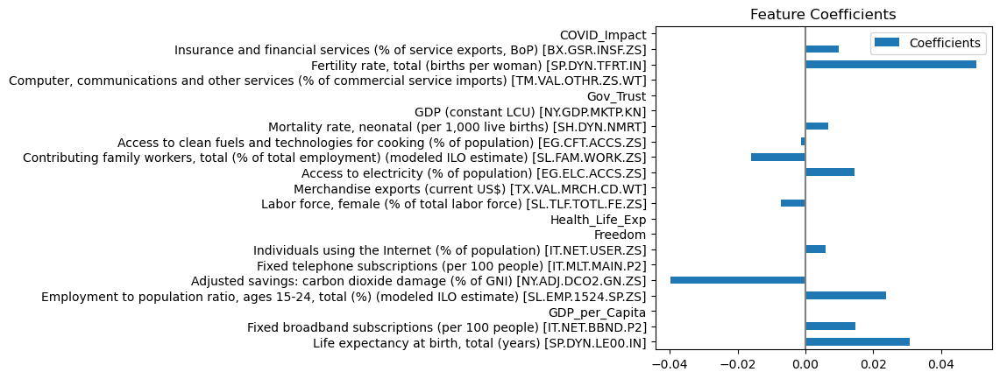

In [45]:
# 预测值与实际值的对比图
y_pred = model.predict(X_test)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.75, color='b')  # 预测值和实际值的散点图
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)  # 添加一条完美预测的对角线
plt.show()

# 各特征系数的影响力
coefficients.plot(kind='barh')
plt.title('Feature Coefficients')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)


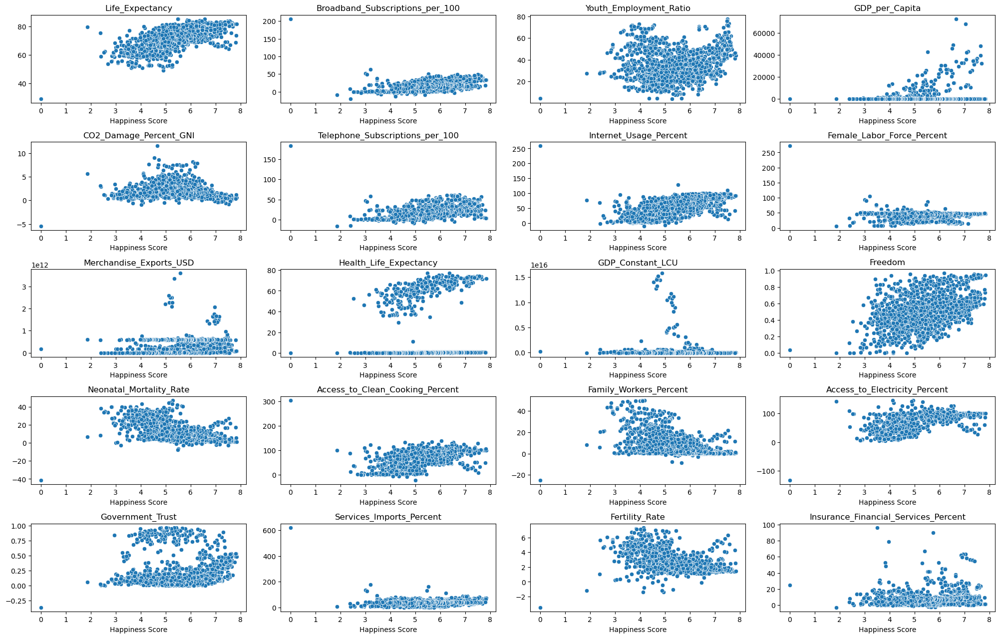

In [93]:
# 特征列列表
features = X.columns

# 设置画布大小
plt.figure(figsize=(20, 15))

# 遍历特征列表，为每个特征绘图
for i, feature in enumerate(features, 1):
    plt.subplot((len(features) + 4) // 4, 4, i)  # 确保足够的子图空间
    sns.scatterplot(x=data5['Happiness_Score'], y=data5[feature])
    plt.title(f'{feature}')
    plt.ylabel('')
    plt.xlabel('Happiness Score')
# 调整子图间距
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/60.png", format='png')
plt.show()


In [83]:
data5.columns 

Index(['Life expectancy at birth, total (years) [SP.DYN.LE00.IN]',
       'Fixed broadband subscriptions (per 100 people) [IT.NET.BBND.P2]',
       'Employment to population ratio, ages 15-24, total (%) (modeled ILO estimate) [SL.EMP.1524.SP.ZS]',
       'GDP_per_Capita',
       'Adjusted savings: carbon dioxide damage (% of GNI) [NY.ADJ.DCO2.GN.ZS]',
       'Fixed telephone subscriptions (per 100 people) [IT.MLT.MAIN.P2]',
       'Individuals using the Internet (% of population) [IT.NET.USER.ZS]',
       'Labor force, female (% of total labor force) [SL.TLF.TOTL.FE.ZS]',
       'Merchandise exports (current US$) [TX.VAL.MRCH.CD.WT]',
       'Health_Life_Exp', 'GDP (constant LCU) [NY.GDP.MKTP.KN]', 'Freedom',
       'Mortality rate, neonatal (per 1,000 live births) [SH.DYN.NMRT]',
       'Access to clean fuels and technologies for cooking (% of population) [EG.CFT.ACCS.ZS]',
       'Contributing family workers, total (% of total employment) (modeled ILO estimate) [SL.FAM.WORK.ZS]',
   

# 2.问题二

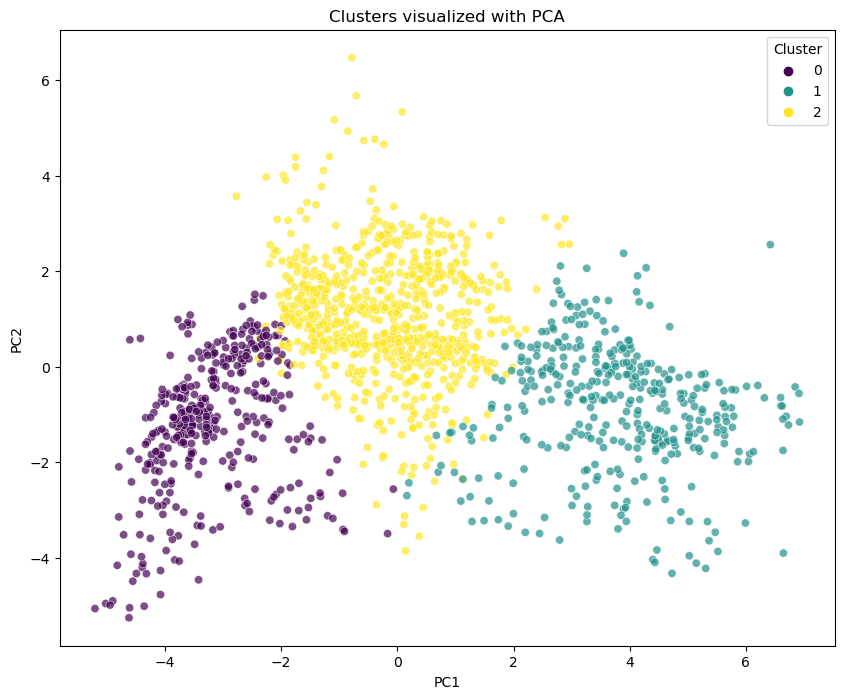

In [109]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
data_pca = pca.fit_transform(numeric_data)

# 将PCA结果和聚类标签组合
data_pca_clustered = pd.DataFrame(data_pca, columns=['PC1', 'PC2'])
data_pca_clustered['Cluster'] = clusters

# 可视化
plt.figure(figsize=(10, 8))
sns.scatterplot(data=data_pca_clustered, x='PC1', y='PC2', hue='Cluster', palette='viridis', alpha=0.7)
plt.title('Clusters visualized with PCA')
plt.show()


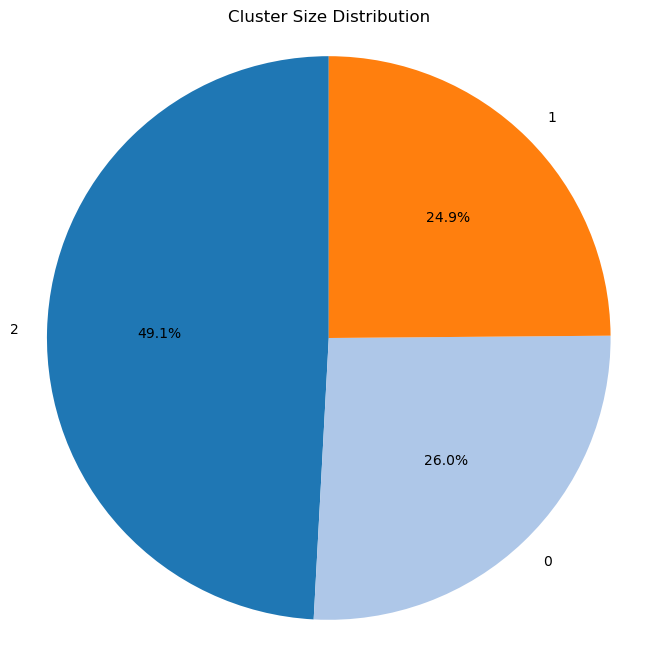

In [110]:
numeric_data['Cluster'] = clusters
# 计算每个簇的大小
cluster_sizes = numeric_data['Cluster'].value_counts()

# 定义颜色数组，数量应与簇的数量一致
colors = plt.cm.tab20.colors[:len(cluster_sizes)]

# 绘制饼图
plt.figure(figsize=(8, 8))  # 设置图形的大小
plt.pie(cluster_sizes, labels=cluster_sizes.index, autopct='%1.1f%%', colors=colors, startangle=90)
plt.title('Cluster Size Distribution')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/61.png", format='png')
# 显示图形
plt.show()


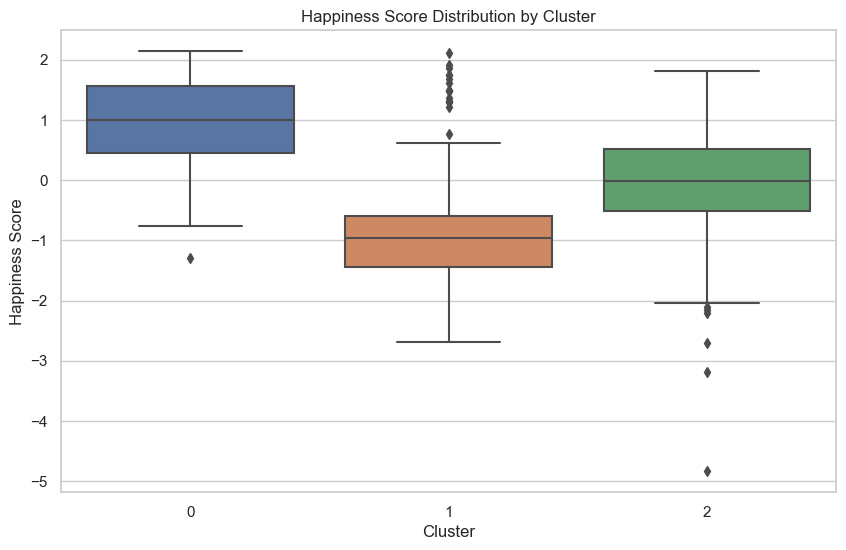

In [111]:
# 确保Seaborn的样式
sns.set(style="whitegrid")

# 创建一个箱型图，表示不同簇的Happiness Score
plt.figure(figsize=(10, 6))  # 设置图形的大小
sns.boxplot(x='Cluster', y='Happiness Score', data=numeric_data)

plt.title('Happiness Score Distribution by Cluster')
plt.xlabel('Cluster')
plt.ylabel('Happiness Score')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/62.png", format='png')
# 显示图形
plt.show()

In [100]:
cluster_sizes = pd.Series({
    0: 895,
    1: 377,
    2: 223
})

# 3.问题三

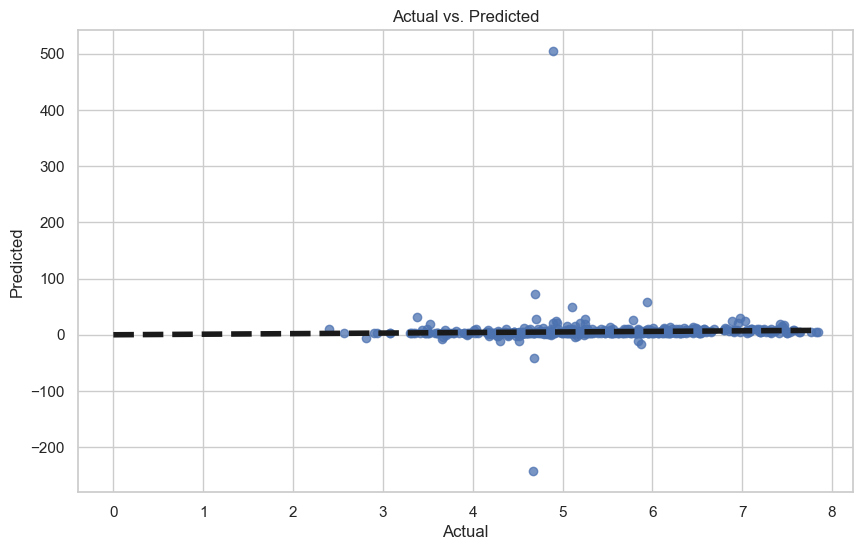

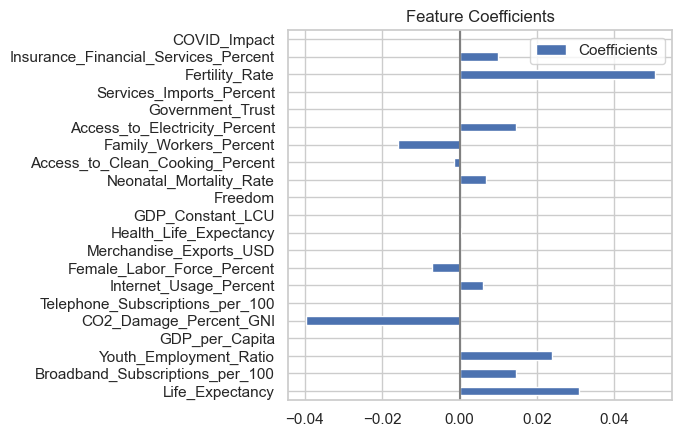

In [135]:
# 预测值与实际值的对比图

y_pred = model3.predict(X_test_interactions_df)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred, alpha=0.75, color='b')  # 预测值和实际值的散点图
plt.xlabel('Actual')
plt.ylabel('Predicted')
plt.title('Actual vs. Predicted')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'k--', lw=4)  # 添加一条完美预测的对角线
plt.show()

# 各特征系数的影响力
coefficients.plot(kind='barh')
plt.title('Feature Coefficients')
plt.axvline(x=0, color='.5')
plt.subplots_adjust(left=.3)


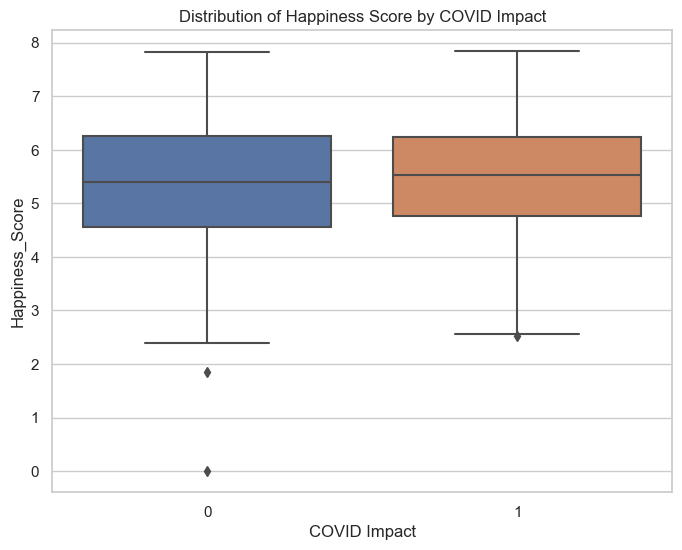

In [140]:
sns.set(style="whitegrid")

# 创建一个箱型图，表示COVID_Impact为0和1时Happiness Score的分布
plt.figure(figsize=(8, 6))  # 设置图形的大小
sns.boxplot(x='COVID_Impact', y='Happiness_Score', data=numeric_data)

plt.title('Distribution of Happiness Score by COVID Impact')
plt.xlabel('COVID Impact')
plt.ylabel('Happiness_Score')
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/63.png", format='png')
# 显示图形
plt.show()

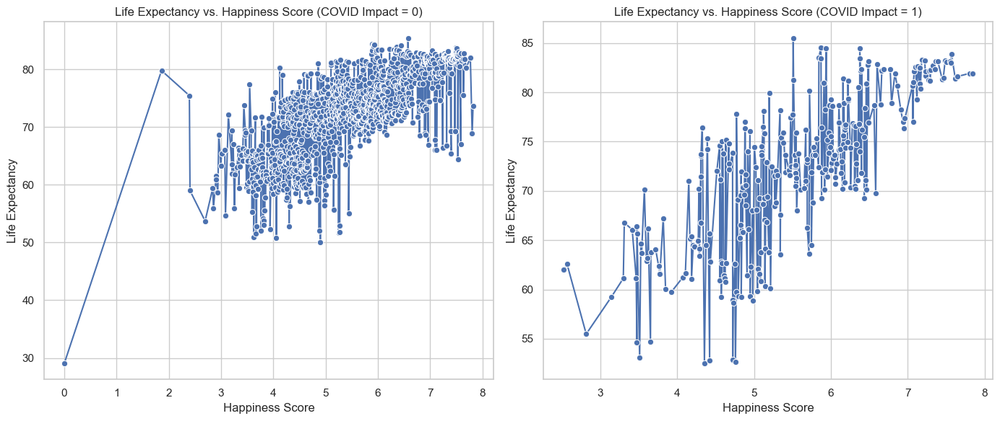

In [149]:
import seaborn as sns
import matplotlib.pyplot as plt

# 设置Seaborn样式
sns.set(style="whitegrid")

# 准备数据：分别筛选COVID_Impact为0和1的数据，并计算每个Happiness Score的Life Expectancy平均值
mean_life_exp_covid_0 = numeric_data[numeric_data['COVID_Impact'] == 0].groupby('Happiness_Score')['Life_Expectancy'].mean().reset_index()
mean_life_exp_covid_1 = numeric_data[numeric_data['COVID_Impact'] == 1].groupby('Happiness_Score')['Life_Expectancy'].mean().reset_index()

# 创建一个1x2的子图布局
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(14, 6))

# 在第一个子图中绘制COVID_Impact为0的数据
sns.lineplot(x='Happiness_Score', y='Life_Expectancy', data=mean_life_exp_covid_0, ax=ax[0], marker='o')
ax[0].set_title('Life Expectancy vs. Happiness Score (COVID Impact = 0)')
ax[0].set_xlabel('Happiness Score')
ax[0].set_ylabel('Life Expectancy')

# 在第二个子图中绘制COVID_Impact为1的数据
sns.lineplot(x='Happiness_Score', y='Life_Expectancy', data=mean_life_exp_covid_1, ax=ax[1], marker='o')
ax[1].set_title('Life Expectancy vs. Happiness Score (COVID Impact = 1)')
ax[1].set_xlabel('Happiness Score')
ax[1].set_ylabel('Life Expectancy')

# 调整子图间距
plt.tight_layout()
plt.savefig("/Users/zhoudaozhen/Desktop/722/iteration3/Figures/65.png", format='png')
# 显示图形
plt.show()


# 8.3 - 解释结果、模型和模式，显示出对结果的清晰理解。

# 8.4 - 使用适当的方法/流程评估结果、模型和模式。

# 1.问题一

Mean Squared Error: 0.34906391309712137
R^2 Score: 0.7051960842155633

Model Evaluation:
The model explains 70.52% of the total variance in the dependent variable.
MSE indicates the average squared difference between actual and predicted values: 0.34906391309712137


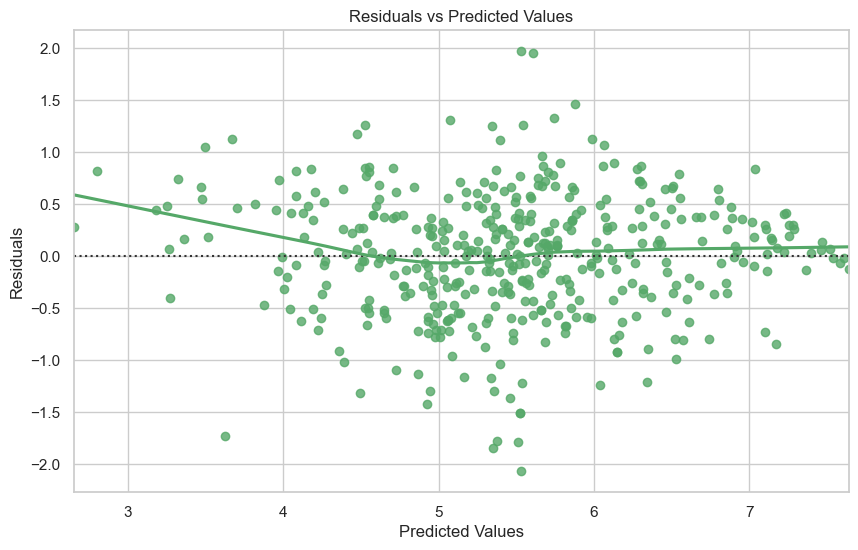

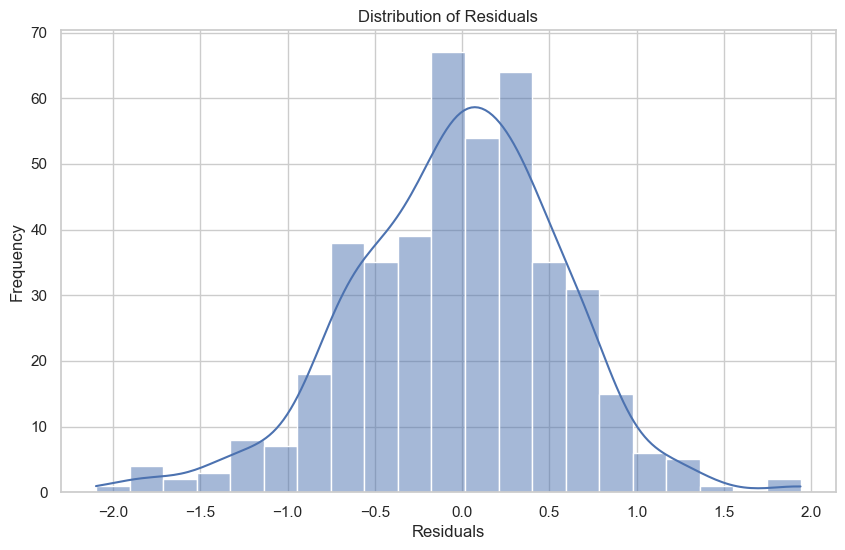

In [120]:
# 基本统计评估
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error:", mse)
print("R^2 Score:", r2)

# 分析模型的适用性和限制
print("\nModel Evaluation:")
print("The model explains {:.2f}% of the total variance in the dependent variable.".format(r2 * 100))
print("MSE indicates the average squared difference between actual and predicted values:", mse)

# 残差分析
residuals = y_test - y_pred
plt.figure(figsize=(10, 6))
sns.residplot(x=y_pred, y=residuals, lowess=True, color="g")
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residuals vs Predicted Values')
plt.show()

# 检查残差的正态分布
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Distribution of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()


# 2.问题二

In [112]:
from sklearn.metrics import silhouette_score

silhouette_avg = silhouette_score(numeric_data, clusters)
print(f"The average silhouette_score is : {silhouette_avg}")


The average silhouette_score is : 0.22207670219607495


# 3.问题三

# 8.5 - 必须进行多次迭代。重复各个步骤以确保您的模型有效/稳健。记录步骤/过程/推理。